In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import shutil

source_path = '/content/drive/MyDrive/Iot/dataset.csv'  # Specify the source file path in your Google Drive
destination_path = 'dataset.csv'  # Specify the destination file path in Colab
shutil.copyfile(source_path, destination_path)

source_path = '/content/drive/MyDrive/Iot/month.csv'  # Specify the source file path in your Google Drive
destination_path = 'month.csv'  # Specify the destination file path in Colab
shutil.copyfile(source_path, destination_path)

'dataset.csv'

**1. Day prediction for 24 hours**

Import the necessary libraries

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

Load and preprocess the data

In [ ]:
# Read the CSV file
df = pd.read_csv('dataset.csv')

# Drop rows with NaN values
df.dropna(inplace=True)

# Replace commas with empty strings and convert to integer
for i in range(1, 25):
    var = 'h' + str(i)
    df[var] = df[var].str.replace(',', '').astype(int)

# Split into features and target
X = df.iloc[:, :-24]  # Features are all columns except the last 24
y = df.iloc[:, -24:]  # Target is the last 24 columns


In [ ]:
X.head()

,zone_id,year,month,day
0,1,2004,1,1
1,1,2004,1,2
2,1,2004,1,3
3,1,2004,1,4
4,1,2004,1,5


In [ ]:
y.head()

,h1,h2,h3,h4,h5,h6,h7,h8,h9,h10,...,h15,h16,h17,h18,h19,h20,h21,h22,h23,h24
0,16853,16450,16517,16873,17064,17727,18574,19355,19534,18611,...,13518,13138,14130,16809,18150,18235,17925,16904,16162,14750
1,14155,14038,14019,14489,14920,16072,17800,19089,19577,20047,...,16127,15448,15839,17727,18895,18650,18443,17580,16467,15258
2,14439,14272,14109,14081,14775,15491,16536,18197,19109,18012,...,13507,13414,13826,15825,16996,16394,15406,14278,13315,12424
3,11273,10415,9943,9859,9881,10248,11016,12780,15108,15680,...,14207,13614,14162,16237,17430,17218,16633,15238,13580,11727
4,10750,10321,10107,10065,10419,12101,14847,15259,14045,14009,...,13845,14350,15501,17307,18786,19089,19192,18416,17006,16018


In [ ]:
# Normalize the data using Min-Max scaling
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)
y_scaled = scaler.fit_transform(y)


In [ ]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.2, random_state=42)


Reshape the data for LSTM input

In [ ]:
# Reshape the data for LSTM input [samples, time steps, features]
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))


Define and train the LSTM model

In [ ]:
# Build the LSTM model
model = Sequential()
model.add(LSTM(50, activation='relu', input_shape=(1, X_train.shape[2])))
model.add(Dense(24))
model.compile(optimizer='adam', loss='mse',metrics=['accuracy'])

# Train the model
history = model.fit(X_train, y_train, epochs=50, batch_size=16, validation_data=(X_test, y_test), verbose=2)


Epoch 1/50
1586/1586 - 7s - loss: 0.0279 - accuracy: 0.1874 - val_loss: 0.0271 - val_accuracy: 0.2525 - 7s/epoch - 4ms/step
Epoch 2/50
1586/1586 - 4s - loss: 0.0264 - accuracy: 0.2626 - val_loss: 0.0264 - val_accuracy: 0.2673 - 4s/epoch - 2ms/step
Epoch 3/50
1586/1586 - 4s - loss: 0.0258 - accuracy: 0.2715 - val_loss: 0.0260 - val_accuracy: 0.2654 - 4s/epoch - 2ms/step
Epoch 4/50
1586/1586 - 4s - loss: 0.0254 - accuracy: 0.2712 - val_loss: 0.0258 - val_accuracy: 0.2935 - 4s/epoch - 3ms/step
Epoch 5/50
1586/1586 - 5s - loss: 0.0253 - accuracy: 0.2623 - val_loss: 0.0257 - val_accuracy: 0.2803 - 5s/epoch - 3ms/step
Epoch 6/50
1586/1586 - 4s - loss: 0.0251 - accuracy: 0.2592 - val_loss: 0.0256 - val_accuracy: 0.2580 - 4s/epoch - 2ms/step
Epoch 7/50
1586/1586 - 4s - loss: 0.0251 - accuracy: 0.2634 - val_loss: 0.0254 - val_accuracy: 0.2729 - 4s/epoch - 2ms/step
Epoch 8/50
1586/1586 - 5s - loss: 0.0248 - accuracy: 0.2636 - val_loss: 0.0248 - val_accuracy: 0.2618 - 5s/epoch - 3ms/step
Epoch 9/

In [ ]:
# Make predictions on the test set
y_pred = model.predict(X_test)

199/199 [==============================] - 0s 1ms/step


In [ ]:
# Calculate the mean absolute error
absolute_diff = np.abs(y_pred - y_test)
mae_per_zone = np.mean(absolute_diff, axis=0)
overall_mae = np.mean(mae_per_zone)
overall_mae

0.06070402949344317

In [ ]:
# Assuming you have already scaled your data using Min-Max scaling

# Inverse transform the scaled predictions (y_pred)
y_pred_original = scaler.inverse_transform(y_pred)

# Inverse transform the scaled true values (y_test)
y_test_original = scaler.inverse_transform(y_test)

# Calculate the mean absolute error
absolute_diff = np.abs(y_pred_original - y_test_original)
mae_per_zone = np.mean(absolute_diff, axis=0)
overall_mae = np.mean(mae_per_zone)
overall_mae

27622.276133289193

In [ ]:
np.mean(y.iloc[:,0])

70921.46125472887

comparing to this average the error is acceptable

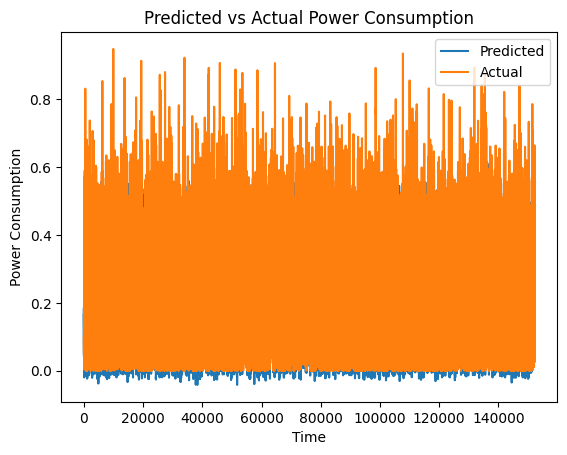

In [ ]:
import matplotlib.pyplot as plt

# Assuming you have the predicted values and actual values stored in y_pred and y_test respectively

# Reshape the predicted and actual values
y_pred_reshaped = y_pred.reshape(-1)
y_actual_reshaped = y_test.reshape(-1)

# Plotting the predicted and actual values
plt.plot(y_pred_reshaped, label='Predicted')
plt.plot(y_actual_reshaped, label='Actual')
plt.xlabel('Time')
plt.ylabel('Power Consumption')
plt.title('Predicted vs Actual Power Consumption')
plt.legend()
plt.show()


In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1 (LSTM)               (None, 50)                11000     
                                                                 
 dense_1 (Dense)             (None, 24)                1224      
                                                                 
Total params: 12,224
Trainable params: 12,224
Non-trainable params: 0
_________________________________________________________________


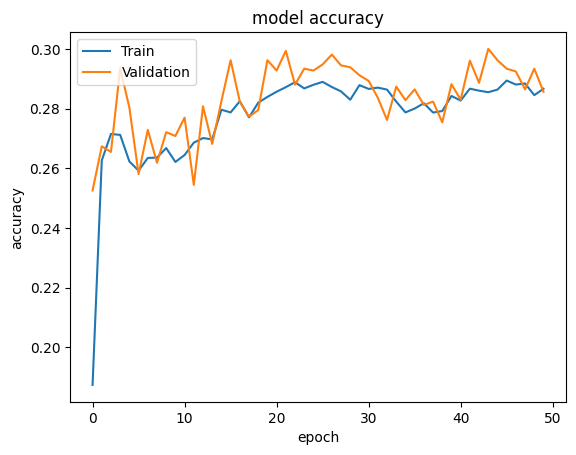

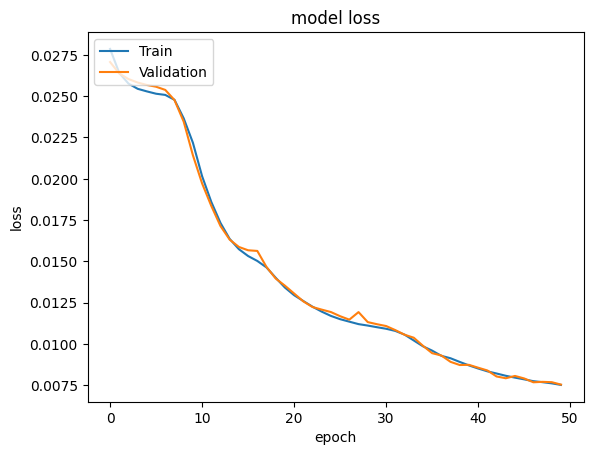

In [ ]:
# summarize history for accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

Seq2Seq-BiLSTM

In [ ]:
from tensorflow.keras.layers import LSTM, Bidirectional, RepeatVector, TimeDistributed

# Encoder
encoder = Sequential()
encoder.add(Bidirectional(LSTM(50, activation='relu'), input_shape=(1, X_train.shape[2])))

# Decoder
decoder = Sequential()
decoder.add(RepeatVector(24))
decoder.add(Bidirectional(LSTM(50, activation='relu', return_sequences=True)))
decoder.add(TimeDistributed(Dense(1)))

# Combined model
model = Sequential([encoder, decoder])
model.compile(optimizer='adam', loss='mse',metrics=['accuracy'])

In [ ]:
# Train the model
history = model.fit(X_train, y_train, epochs=50, batch_size=16, validation_data=(X_test, y_test), verbose=2)

Epoch 1/50
1586/1586 - 54s - loss: 0.0262 - accuracy: 2.6272e-05 - val_loss: 0.0237 - val_accuracy: 5.9111e-05 - 54s/epoch - 34ms/step
Epoch 2/50
1586/1586 - 44s - loss: 0.0204 - accuracy: 2.6272e-05 - val_loss: 0.0137 - val_accuracy: 5.9111e-05 - 44s/epoch - 27ms/step
Epoch 3/50
1586/1586 - 40s - loss: 0.0092 - accuracy: 2.6272e-05 - val_loss: 0.0056 - val_accuracy: 5.9111e-05 - 40s/epoch - 26ms/step
Epoch 4/50
1586/1586 - 43s - loss: 0.0073 - accuracy: 3.7765e-05 - val_loss: 0.0061 - val_accuracy: 5.9111e-05 - 43s/epoch - 27ms/step
Epoch 5/50
1586/1586 - 40s - loss: 0.0051 - accuracy: 3.2839e-05 - val_loss: 0.0032 - val_accuracy: 5.9111e-05 - 40s/epoch - 26ms/step
Epoch 6/50
1586/1586 - 40s - loss: 0.0041 - accuracy: 4.9259e-05 - val_loss: 0.0033 - val_accuracy: 5.9111e-05 - 40s/epoch - 25ms/step
Epoch 7/50
1586/1586 - 42s - loss: 0.0038 - accuracy: 5.2543e-05 - val_loss: 0.0032 - val_accuracy: 5.9111e-05 - 42s/epoch - 27ms/step
Epoch 8/50
1586/1586 - 40s - loss: 0.0033 - accuracy: 5

In [ ]:
# Make predictions on the test set
y_pred = model.predict(X_test)

# Reshape y_test to match the shape of y_pred
y_test_reshaped = y_test.reshape(y_pred.shape)

absolute_diff = np.abs(y_pred - y_test_reshaped)
mae_per_zone = np.mean(absolute_diff, axis=0)
overall_mae = np.mean(mae_per_zone)
overall_mae

199/199 [==============================] - 4s 17ms/step


0.023288654970779477

In [ ]:
# Assuming you have already scaled your data using Min-Max scaling

y_pred_reshaped = y_pred.reshape(y_test.shape)

# Inverse transform the scaled predictions (y_pred)
y_pred_original = scaler.inverse_transform(y_pred_reshaped)

# Inverse transform the scaled true values (y_test)
y_test_original = scaler.inverse_transform(y_test)

# Calculate the mean absolute error
absolute_diff = np.abs(y_pred_original - y_test_original)
mae_per_zone = np.mean(absolute_diff, axis=0)
overall_mae = np.mean(mae_per_zone)
overall_mae

10629.870308800702

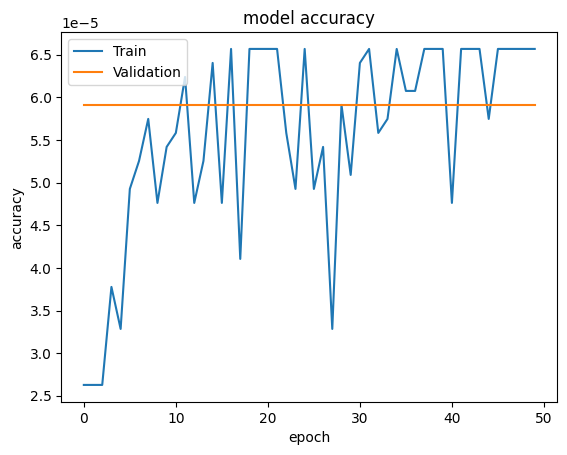

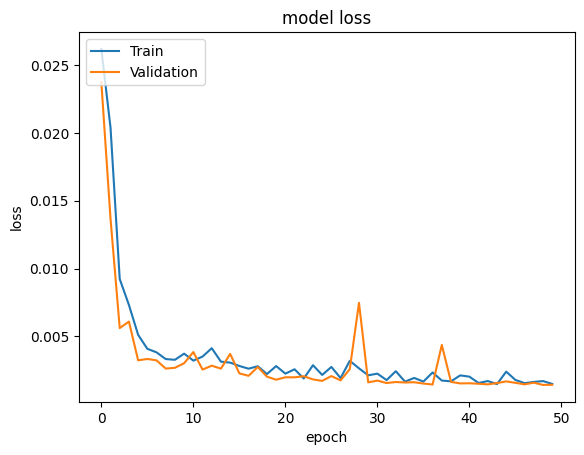

In [ ]:
# summarize history for accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

<ipython-input-41-f15d6c05b510>:2: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  yearly_power_consumption = df.groupby(['zone_id', 'year'])['h1', 'h2', 'h3', 'h4', 'h5', 'h6', 'h7', 'h8', 'h9', 'h10', 'h11', 'h12', 'h13', 'h14', 'h15', 'h16', 'h17', 'h18', 'h19', 'h20', 'h21', 'h22', 'h23', 'h24'].sum()


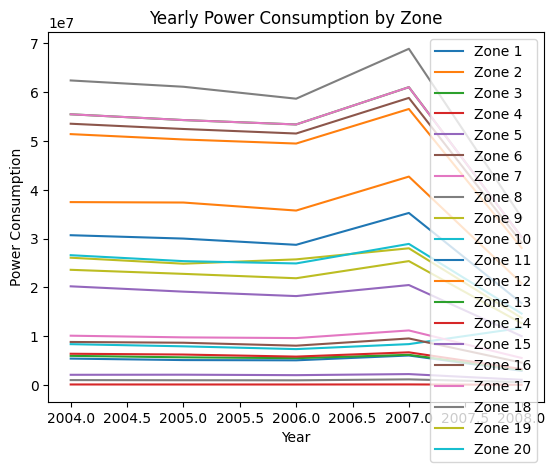

In [ ]:
# Group the data by zone_id and year, and calculate the sum of power consumption
yearly_power_consumption = df.groupby(['zone_id', 'year'])['h1', 'h2', 'h3', 'h4', 'h5', 'h6', 'h7', 'h8', 'h9', 'h10', 'h11', 'h12', 'h13', 'h14', 'h15', 'h16', 'h17', 'h18', 'h19', 'h20', 'h21', 'h22', 'h23', 'h24'].sum()

# Reset the index to flatten the grouped DataFrame
yearly_power_consumption = yearly_power_consumption.reset_index()

# Iterate over unique zone_ids and create a separate plot for each zone_id
for zone_id in yearly_power_consumption['zone_id'].unique():
    # Select data for the current zone_id
    zone_data = yearly_power_consumption[yearly_power_consumption['zone_id'] == zone_id]

    # Plot the yearly power consumption for the current zone_id
    plt.plot(zone_data['year'], zone_data['h1'], label=f'Zone {zone_id}')  # Adjust the column name as per your data

# Set plot title and labels
plt.title('Yearly Power Consumption by Zone')
plt.xlabel('Year')
plt.ylabel('Power Consumption')
plt.legend()

# Display the plot
plt.show()


<ipython-input-43-a86c5e3b412b>:5: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  daily_consumptions = filtered_data.groupby(['zone_id', 'day'])['h1', 'h2', 'h3', 'h4', 'h5', 'h6', 'h7', 'h8', 'h9', 'h10', 'h11', 'h12', 'h13', 'h14', 'h15', 'h16', 'h17', 'h18', 'h19', 'h20', 'h21', 'h22', 'h23', 'h24'].sum()


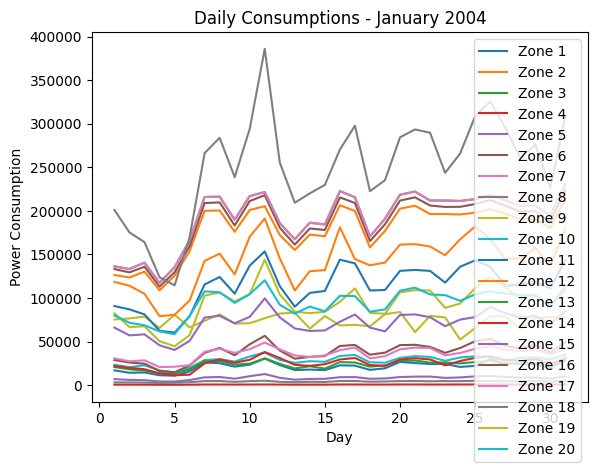

In [ ]:
# Filter the data for the first month of 2004
filtered_data = df[(df['year'] == 2004) & (df['month'] == 1)]

# Group the filtered data by zone_id and day, and calculate the sum of power consumption
daily_consumptions = filtered_data.groupby(['zone_id', 'day'])['h1', 'h2', 'h3', 'h4', 'h5', 'h6', 'h7', 'h8', 'h9', 'h10', 'h11', 'h12', 'h13', 'h14', 'h15', 'h16', 'h17', 'h18', 'h19', 'h20', 'h21', 'h22', 'h23', 'h24'].sum()

# Reset the index to flatten the grouped DataFrame
daily_consumptions = daily_consumptions.reset_index()

# Iterate over unique zone_ids and create a separate plot for each zone_id
for zone_id in daily_consumptions['zone_id'].unique():
    # Select data for the current zone_id
    zone_data = daily_consumptions[daily_consumptions['zone_id'] == zone_id]

    # Plot the daily consumptions for the current zone_id
    plt.plot(zone_data['day'], zone_data['h1'], label=f'Zone {zone_id}')  # Adjust the column name as per your data

# Set plot title and labels
plt.title('Daily Consumptions - January 2004')
plt.xlabel('Day')
plt.ylabel('Power Consumption')
plt.legend()

# Display the plot
plt.show()



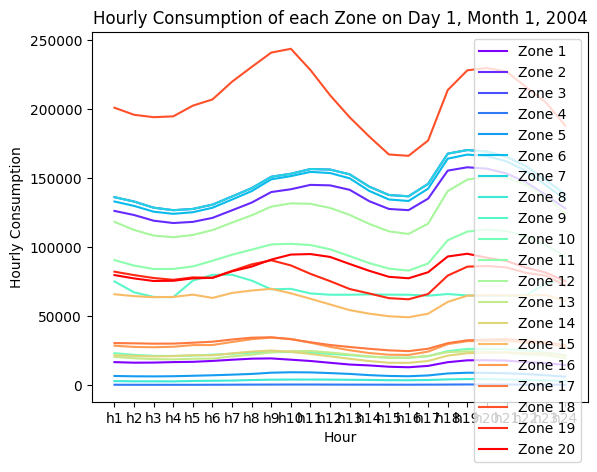

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# Assuming you have a DataFrame called 'df' with the consumption data

# Filter the data for the specified day, month, and year
filtered_data = df[(df['day'] == 1) & (df['month'] == 1) & (df['year'] == 2004)]

# Get the unique zone_ids and number of zones
zone_ids = filtered_data['zone_id'].unique()
num_zones = len(zone_ids)

# Create a colormap with a unique color for each zone_id
colors = cm.rainbow(np.linspace(0, 1, num_zones))

# Iterate over each unique 'zone_id' and plot the hourly consumption with unique colors
for i, zone_id in enumerate(zone_ids):
    zone_data = filtered_data[filtered_data['zone_id'] == zone_id]
    hourly_consumption = zone_data.loc[:, 'h1':'h24']
    plt.plot(hourly_consumption.columns, hourly_consumption.values.flatten(), color=colors[i], label=f'Zone {zone_id}')

plt.xlabel('Hour')
plt.ylabel('Hourly Consumption')
plt.title('Hourly Consumption of each Zone on Day 1, Month 1, 2004')
plt.legend()
plt.show()



**2. Month prediction**

In [ ]:
valid_columns = ['h1', 'h2', 'h3', 'h4', 'h5', 'h6', 'h7', 'h8', 'h9', 'h10', 'h11', 'h12', 'h13', 'h14', 'h15', 'h16', 'h17', 'h18', 'h19', 'h20', 'h21', 'h22', 'h23', 'h24']
df['total_consumption'] = df[valid_columns].sum(axis=1)

In [ ]:
df.to_csv('month.csv', index=False)

In [ ]:
df = pd.read_csv("month.csv")

In [ ]:
# Aggregate the daily consumption data into monthly totals
monthly_data = df.groupby(['year', 'month'])['total_consumption'].sum().reset_index()

# Normalize the monthly consumption data using Min-Max scaling
scaler = MinMaxScaler()
monthly_data['scaled_consumption'] = scaler.fit_transform(monthly_data['total_consumption'].values.reshape(-1, 1))

# Split the data into train and test sets
train_data, test_data = train_test_split(monthly_data, test_size=0.2, shuffle=False)

# Prepare the train and test data for LSTM input
X_train = train_data[['year', 'month']].values
y_train = train_data['scaled_consumption'].values

X_test = test_data[['year', 'month']].values
y_test = test_data['scaled_consumption'].values

# Reshape the input data for LSTM (samples, time steps, features)
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

# Define the LSTM model
model = Sequential()
model.add(LSTM(64, input_shape=(1, 2)))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam', metrics=['accuracy'])

# Train the LSTM model
history = model.fit(X_train, y_train, epochs=100, batch_size=32, verbose=1)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Inverse transform the scaled predictions and actual values
y_pred_inv = scaler.inverse_transform(y_pred)
y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))

# Calculate the mean absolute error (MAE)
mae = np.mean(np.abs(y_pred_inv - y_test_inv))
print("MAE:", mae)


Epoch 1/100
2/2 [==============================] - 2s 10ms/step - loss: 1.1991 - accuracy: 0.0233
Epoch 2/100
2/2 [==============================] - 0s 9ms/step - loss: 1.1527 - accuracy: 0.0233
Epoch 3/100
2/2 [==============================] - 0s 9ms/step - loss: 1.1165 - accuracy: 0.0233
Epoch 4/100
2/2 [==============================] - 0s 8ms/step - loss: 1.0721 - accuracy: 0.0233
Epoch 5/100
2/2 [==============================] - 0s 9ms/step - loss: 0.9698 - accuracy: 0.0233
Epoch 6/100
2/2 [==============================] - 0s 10ms/step - loss: 0.8280 - accuracy: 0.0233
Epoch 7/100
2/2 [==============================] - 0s 9ms/step - loss: 0.7827 - accuracy: 0.0233
Epoch 8/100
2/2 [==============================] - 0s 10ms/step - loss: 0.7554 - accuracy: 0.0233
Epoch 9/100
2/2 [==============================] - 0s 10ms/step - loss: 0.7311 - accuracy: 0.0233
Epoch 10/100
2/2 [==============================] - 0s 10ms/step - loss: 0.7060 - accuracy: 0.0233
Epoch 11/100
2/2 [======

In [ ]:
# Calculate the mean absolute error (MAE)
mae = np.mean(np.abs(y_pred - y_test))
print("MAE:", mae)

MAE: 0.21314559007436182


In [ ]:
# Normalize the monthly consumption data using Min-Max scaling
scaler = MinMaxScaler()
df['scaled_consumption'] = scaler.fit_transform(df['total_consumption'].values.reshape(-1, 1))

# Split the data into train and test sets
train_data = df[df['day'] <= 15]
test_data = df[df['day'] > 15]

# Prepare the train and test data for LSTM input
X_train = train_data[['year', 'month']].values
y_train = train_data['scaled_consumption'].values

X_test = test_data[['year', 'month']].values
y_test = test_data['scaled_consumption'].values

# Reshape the input data for LSTM (samples, time steps, features)
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

# Define the LSTM model
model = Sequential()
model.add(LSTM(64, input_shape=(1, 2)))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam', metrics = ['accuracy'])

# Train the LSTM model
history = model.fit(X_train, y_train, epochs=100, batch_size=32, verbose=1)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Inverse transform the scaled predictions and actual values
y_pred_inv = scaler.inverse_transform(y_pred)
y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))

# Calculate the mean absolute error (MAE)
mae = np.mean(np.abs(y_pred_inv - y_test_inv))
print("MAE:", mae)


Epoch 1/100
492/492 [==============================] - 5s 4ms/step - loss: 0.0295 - accuracy: 6.3532e-05
Epoch 2/100
492/492 [==============================] - 2s 5ms/step - loss: 0.0294 - accuracy: 6.3532e-05
Epoch 3/100
492/492 [==============================] - 3s 5ms/step - loss: 0.0294 - accuracy: 6.3532e-05
Epoch 4/100
492/492 [==============================] - 2s 5ms/step - loss: 0.0294 - accuracy: 6.3532e-05
Epoch 5/100
492/492 [==============================] - 2s 3ms/step - loss: 0.0293 - accuracy: 6.3532e-05
Epoch 6/100
492/492 [==============================] - 2s 5ms/step - loss: 0.0295 - accuracy: 6.3532e-05
Epoch 7/100
492/492 [==============================] - 2s 3ms/step - loss: 0.0293 - accuracy: 6.3532e-05
Epoch 8/100
492/492 [==============================] - 2s 3ms/step - loss: 0.0294 - accuracy: 6.3532e-05
Epoch 9/100
492/492 [==============================] - 2s 3ms/step - loss: 0.0294 - accuracy: 6.3532e-05
Epoch 10/100
492/492 [==============================] -

In [ ]:
# Calculate the mean absolute error (MAE)
mae = np.mean(np.abs(y_pred - y_test))
print("MAE:", mae)

MAE: 0.14406580936131302


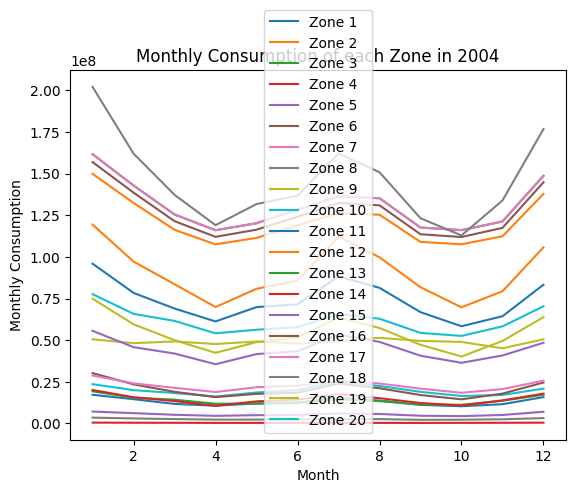

In [ ]:
# Filter the data for the year 2004
df_2004 = df[df['year'] == 2004]

# Group the data by 'zone_id' and 'month' and calculate the sum of 'total_consumption'
monthly_consumption = df_2004.groupby(['zone_id', 'month'])['total_consumption'].sum().reset_index()

# Iterate over each unique 'zone_id' and plot the monthly consumption
for zone_id in monthly_consumption['zone_id'].unique():
    zone_data = monthly_consumption[monthly_consumption['zone_id'] == zone_id]
    plt.plot(zone_data['month'], zone_data['total_consumption'], label=f'Zone {zone_id}')

plt.xlabel('Month')
plt.ylabel('Monthly Consumption')
plt.title('Monthly Consumption of each Zone in 2004')
plt.legend()
plt.show()


**3. Clustering**

clustering according to cunsumption using k-means k=5

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


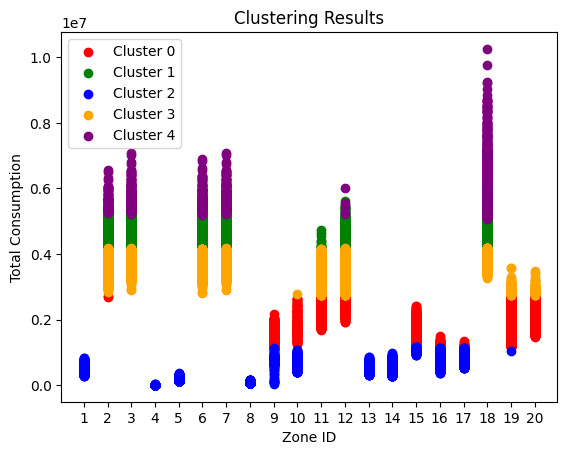

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.ticker as ticker

df = pd.read_csv('month.csv')

# Filter the relevant columns for clustering
data = df.loc[:, 'h1':'h24']

# Standardize the data
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

# Perform K-means clustering
kmeans = KMeans(n_clusters=5, random_state=42)
clusters = kmeans.fit_predict(data_scaled)

# Add the cluster labels to the original DataFrame
df['cluster'] = clusters

# Plot the clusters
colors = ['red', 'green', 'blue', 'orange', 'purple']
labels = df['cluster']

# Iterate over each unique cluster and plot the corresponding zone_ids
for cluster in np.unique(labels):
    cluster_data = df[df['cluster'] == cluster]
    plt.scatter(cluster_data['zone_id'], cluster_data['total_consumption'], c=colors[cluster], label=f'Cluster {cluster}')

plt.xlabel('Zone ID')
plt.ylabel('Total Consumption')
plt.title('Clustering Results')

# Set the x-axis tick locations and labels
plt.xticks(np.arange(1, 21))

plt.legend()
plt.show()


clustering according to consumption and date

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


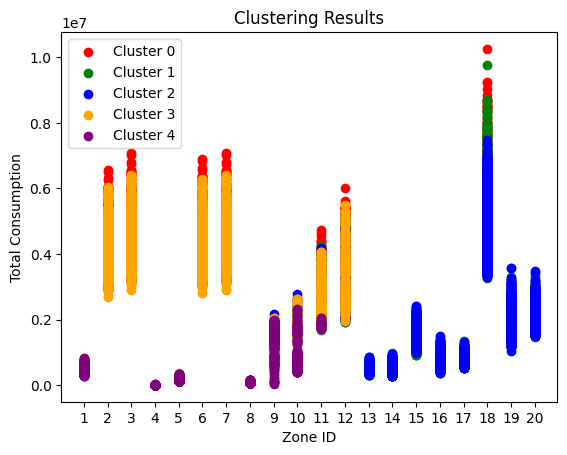

In [ ]:
# Filter the relevant columns for clustering
data = df.loc[:, 'h1':'h24']

# Standardize the data
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

# Concatenate the zone_id, year, month, and day as additional features
additional_features = df[['zone_id', 'year', 'month', 'day']]
data_scaled = np.concatenate((data_scaled, additional_features), axis=1)

# Perform K-means clustering
kmeans = KMeans(n_clusters=5, random_state=42)
clusters = kmeans.fit_predict(data_scaled)

# Add the cluster labels to the original DataFrame
df['cluster'] = clusters

# Plot the clusters
colors = ['red', 'green', 'blue', 'orange', 'purple']
labels = df['cluster']

# Iterate over each unique cluster and plot the corresponding zone_ids
for cluster in np.unique(labels):
    cluster_data = df[df['cluster'] == cluster]
    plt.scatter(cluster_data['zone_id'], cluster_data['total_consumption'], c=colors[cluster], label=f'Cluster {cluster}')

plt.xlabel('Zone ID')
plt.ylabel('Total Consumption')
plt.title('Clustering Results')

# Set the x-axis tick locations and labels
plt.xticks(np.arange(1, 21))

plt.legend()
plt.show()


3d plot

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


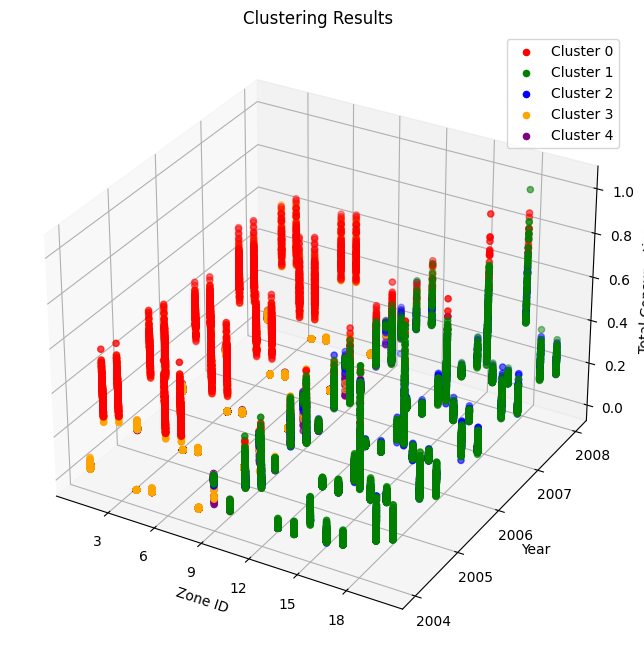

In [ ]:
from mpl_toolkits.mplot3d import Axes3D

# Filter the relevant columns for clustering
data = df.loc[:, 'h1':'h24']

# Standardize the data
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

# Concatenate the zone_id, year, month, and day as additional features
additional_features = df[['zone_id', 'year', 'month', 'day']]
data_scaled = np.concatenate((data_scaled, additional_features), axis=1)

# Perform K-means clustering
kmeans = KMeans(n_clusters=5, random_state=42)
clusters = kmeans.fit_predict(data_scaled)

# Add the cluster labels to the original DataFrame
df['cluster'] = clusters

# Create a larger 3D plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot the clusters in 3D space
colors = ['red', 'green', 'blue', 'orange', 'purple']
labels = df['cluster']

# Iterate over each unique cluster and plot the corresponding zone_ids
for cluster in np.unique(labels):
    cluster_data = df[df['cluster'] == cluster]
    ax.scatter(cluster_data['zone_id'], cluster_data['year'], cluster_data['total_consumption'], c=colors[cluster], label=f'Cluster {cluster}')

ax.set_xlabel('Zone ID')
ax.set_ylabel('Year')
ax.set_zlabel('Total Consumption')
ax.set_title('Clustering Results')

# Set formatter for x-axis and y-axis to display only integer values
ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
ax.yaxis.set_major_locator(ticker.MaxNLocator(integer=True))

plt.legend()
plt.show()


find the number of clusters using elbow algorithm

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

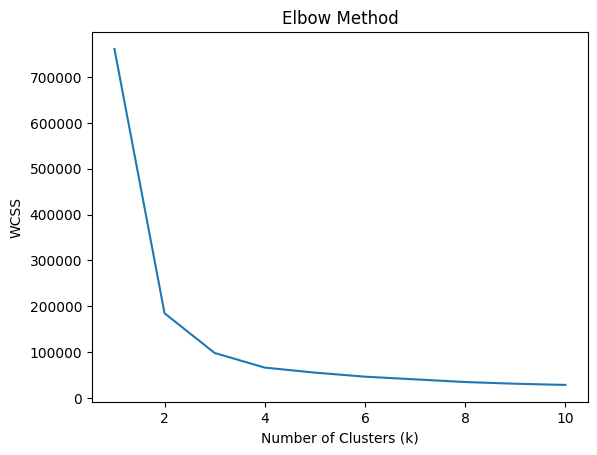

In [ ]:
# Filter the relevant columns for clustering
data = df.loc[:, 'h1':'h24']

# Standardize the data
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

# Perform K-means clustering for different values of k
k_values = range(1, 11)
wcss = []

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(data_scaled)
    wcss.append(kmeans.inertia_)

# Plot the within-cluster sum of squares (WCSS) for different values of k
plt.plot(k_values, wcss)
plt.xlabel('Number of Clusters (k)')
plt.ylabel('WCSS')
plt.title('Elbow Method')
plt.show()


k-means k = 3

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


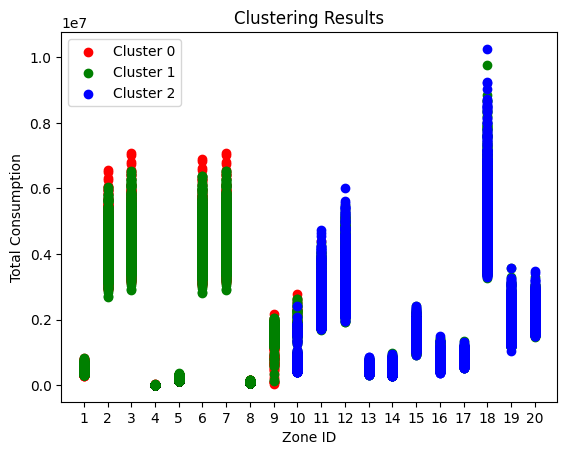

In [ ]:
# Filter the relevant columns for clustering
data = df.loc[:, 'h1':'h24']

# Standardize the data
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

# Concatenate the zone_id, year, month, and day as additional features
additional_features = df[['zone_id', 'year', 'month', 'day']]
data_scaled = np.concatenate((data_scaled, additional_features), axis=1)

# Perform K-means clustering
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(data_scaled)

# Add the cluster labels to the original DataFrame
df['cluster'] = clusters

# Plot the clusters
colors = ['red', 'green', 'blue', 'orange', 'purple']
labels = df['cluster']

# Iterate over each unique cluster and plot the corresponding zone_ids
for cluster in np.unique(labels):
    cluster_data = df[df['cluster'] == cluster]
    plt.scatter(cluster_data['zone_id'], cluster_data['total_consumption'], c=colors[cluster], label=f'Cluster {cluster}')

plt.xlabel('Zone ID')
plt.ylabel('Total Consumption')
plt.title('Clustering Results')

# Set the x-axis tick locations and labels
plt.xticks(np.arange(1, 21))

plt.legend()
plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


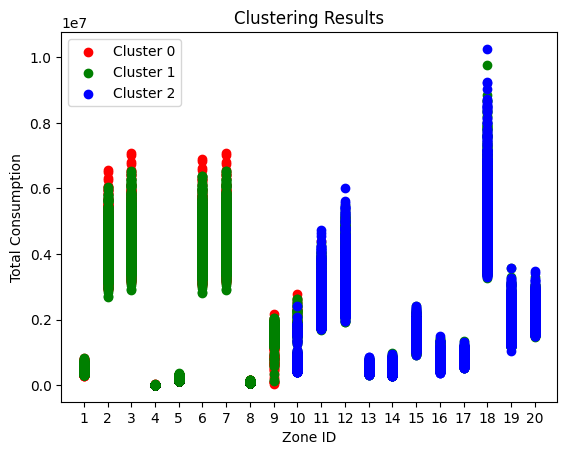

In [ ]:
# Filter the relevant columns for clustering
data = df.loc[:, 'h1':'h24']

# Standardize the data
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

# Concatenate the zone_id, year, month, and day as additional features
additional_features = df[['zone_id', 'year', 'month', 'day']]
data_scaled = np.concatenate((data_scaled, additional_features), axis=1)

# Perform K-means clustering
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(data_scaled)

# Add the cluster labels to the original DataFrame
df['cluster'] = clusters

# Plot the clusters
colors = ['red', 'green', 'blue', 'orange', 'purple']
labels = df['cluster']

# Iterate over each unique cluster and plot the corresponding zone_ids
for cluster in np.unique(labels):
    cluster_data = df[df['cluster'] == cluster]
    plt.scatter(cluster_data['zone_id'], cluster_data['total_consumption'], c=colors[cluster], label=f'Cluster {cluster}')

plt.xlabel('Zone ID')
plt.ylabel('Total Consumption')
plt.title('Clustering Results')

# Set the x-axis tick locations and labels
plt.xticks(np.arange(1, 21))

plt.legend()
plt.show()


dbscan

<ipython-input-20-baa7f5db303a>:25: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('viridis', len(unique_clusters))


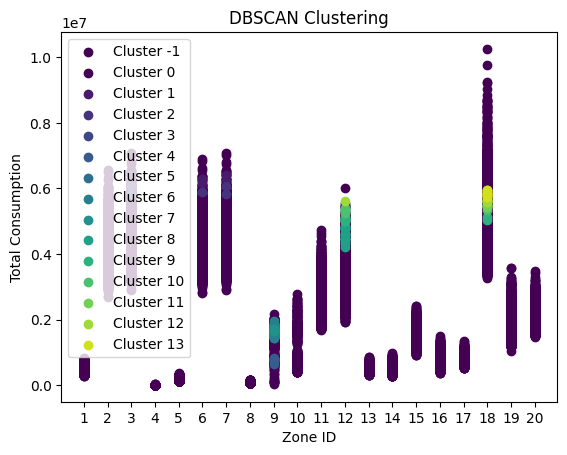

In [ ]:
from sklearn.cluster import DBSCAN

# Filter the relevant columns for clustering
data = df.loc[:, 'h1':'h24']

# Standardize the data
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

# Perform DBSCAN clustering
dbscan = DBSCAN(eps=0.5, min_samples=5)
clusters = dbscan.fit_predict(data_scaled)

# Add the cluster labels to the original DataFrame
df['cluster'] = clusters

# Set the unique clusters
unique_clusters = np.unique(clusters)

# Define a colormap for the clusters
colors = plt.cm.get_cmap('viridis', len(unique_clusters))

# Create a scatter plot for each cluster
for cluster in unique_clusters:
    cluster_data = df[df['cluster'] == cluster]
    plt.scatter(cluster_data['zone_id'], cluster_data['total_consumption'], c=[colors(cluster)], label=f'Cluster {cluster}')

plt.xlabel('Zone ID')
plt.ylabel('Total Consumption')
plt.title('DBSCAN Clustering')

# Set the x-axis tick locations and labels
plt.xticks(np.arange(1, 21))

plt.legend()
plt.show()


**4.Pattern**

In [ ]:
# Group the data by the cluster labels
cluster_groups = df.groupby('cluster')

# Iterate over each cluster group and extract the consumption pattern
for cluster, group in cluster_groups:
    consumption_pattern = group[['h1', 'h2', 'h3', 'h4', 'h5', 'h6', 'h7', 'h8', 'h9', 'h10', 'h11', 'h12', 'h13', 'h14', 'h15', 'h16', 'h17', 'h18', 'h19', 'h20', 'h21', 'h22', 'h23', 'h24']]
    # Perform further analysis on the consumption pattern for each cluster
    # For example, you can calculate the average, maximum, or minimum consumption values for each hour
    average_consumption = consumption_pattern.mean(axis=0)
    max_consumption = consumption_pattern.max(axis=0)
    min_consumption = consumption_pattern.min(axis=0)

    # Print or store the results for each cluster
    print(f"Cluster {cluster} Average Consumption:\n{average_consumption}")
    print(f"Cluster {cluster} Maximum Consumption:\n{max_consumption}")
    print(f"Cluster {cluster} Minimum Consumption:\n{min_consumption}")


Cluster 0 Average Consumption:
h1      81590.138278
h2      79351.280855
h3      78245.337959
h4      78239.257399
h5      79803.033526
h6      83895.582586
h7      90973.638462
h8      95963.489377
h9      97144.952352
h10     98172.752057
h11     98865.759425
h12     98853.736338
h13     98559.621393
h14     98249.333906
h15     97716.425273
h16     97803.772320
h17     99392.006386
h18    102532.970404
h19    104009.769250
h20    104002.550780
h21    103553.600639
h22    100167.812600
h23     93444.147489
h24     86304.677392
dtype: float64
Cluster 0 Maximum Consumption:
h1     288630
h2     288665
h3     289997
h4     294467
h5     302460
h6     308080
h7     319350
h8     346909
h9     334437
h10    321181
h11    308907
h12    303212
h13    310593
h14    319262
h15    328653
h16    328719
h17    325562
h18    317621
h19    325029
h20    326808
h21    326362
h22    317140
h23    303225
h24    292177
dtype: int64
Cluster 0 Minimum Consumption:
h1      75
h2      71
h3       1
h4    

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


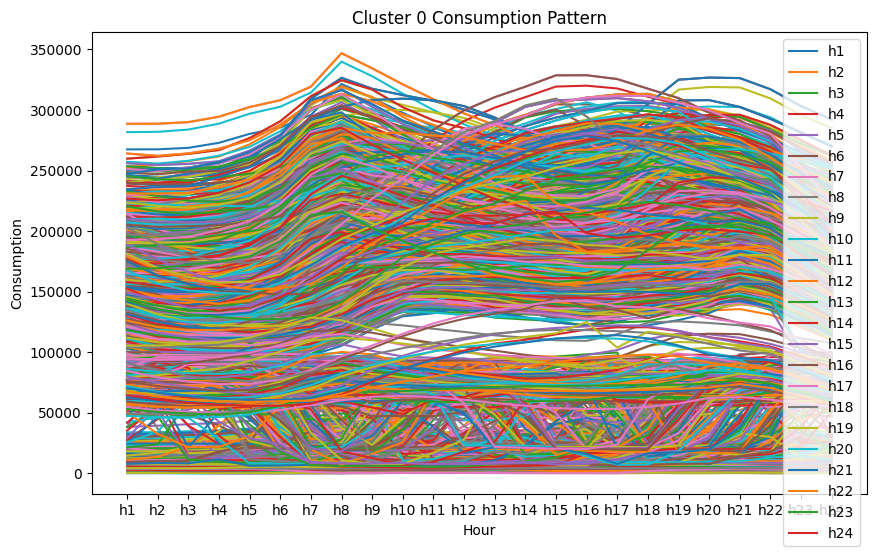

Cluster 0 Average Consumption:
h1      81590.138278
h2      79351.280855
h3      78245.337959
h4      78239.257399
h5      79803.033526
h6      83895.582586
h7      90973.638462
h8      95963.489377
h9      97144.952352
h10     98172.752057
h11     98865.759425
h12     98853.736338
h13     98559.621393
h14     98249.333906
h15     97716.425273
h16     97803.772320
h17     99392.006386
h18    102532.970404
h19    104009.769250
h20    104002.550780
h21    103553.600639
h22    100167.812600
h23     93444.147489
h24     86304.677392
dtype: float64
Cluster 0 Maximum Consumption:
h1     288630
h2     288665
h3     289997
h4     294467
h5     302460
h6     308080
h7     319350
h8     346909
h9     334437
h10    321181
h11    308907
h12    303212
h13    310593
h14    319262
h15    328653
h16    328719
h17    325562
h18    317621
h19    325029
h20    326808
h21    326362
h22    317140
h23    303225
h24    292177
dtype: int64
Cluster 0 Minimum Consumption:
h1      75
h2      71
h3       1
h4    

In [ ]:
# Select a specific cluster for analysis
cluster_id = 0
cluster_data = df[df['cluster'] == cluster_id]

# Extract the consumption pattern for the cluster
consumption_pattern = cluster_data[['h1', 'h2', 'h3', 'h4', 'h5', 'h6', 'h7', 'h8', 'h9', 'h10', 'h11', 'h12', 'h13', 'h14', 'h15', 'h16', 'h17', 'h18', 'h19', 'h20', 'h21', 'h22', 'h23', 'h24']]

# Plot the consumption pattern
plt.figure(figsize=(10, 6))
plt.plot(consumption_pattern.T)
plt.xlabel('Hour')
plt.ylabel('Consumption')
plt.title(f'Cluster {cluster_id} Consumption Pattern')
plt.legend(consumption_pattern.columns)
plt.show()

# Perform statistical analysis
average_consumption = consumption_pattern.mean()
max_consumption = consumption_pattern.max()
min_consumption = consumption_pattern.min()

# Print the statistical analysis results
print(f"Cluster {cluster_id} Average Consumption:\n{average_consumption}")
print(f"Cluster {cluster_id} Maximum Consumption:\n{max_consumption}")
print(f"Cluster {cluster_id} Minimum Consumption:\n{min_consumption}")


**Consumption pattern and clustering**

In [1]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

cluster for year 2004 month 1 for 24 hours

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


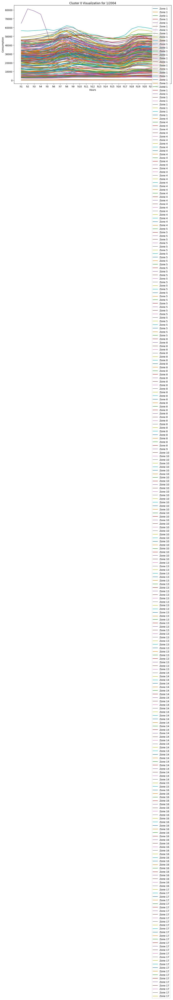

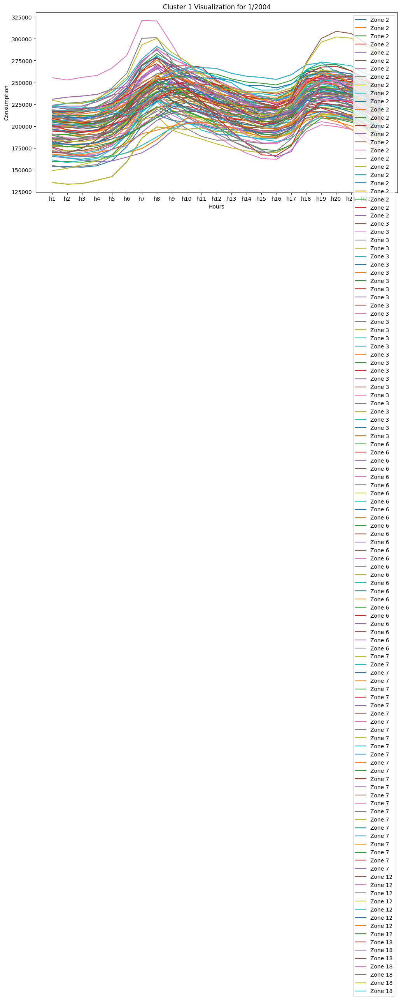

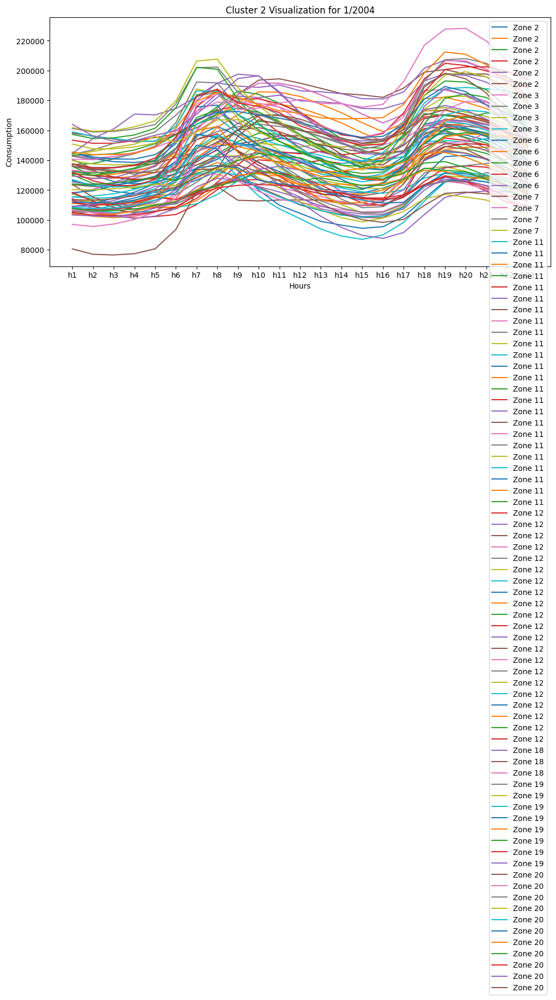

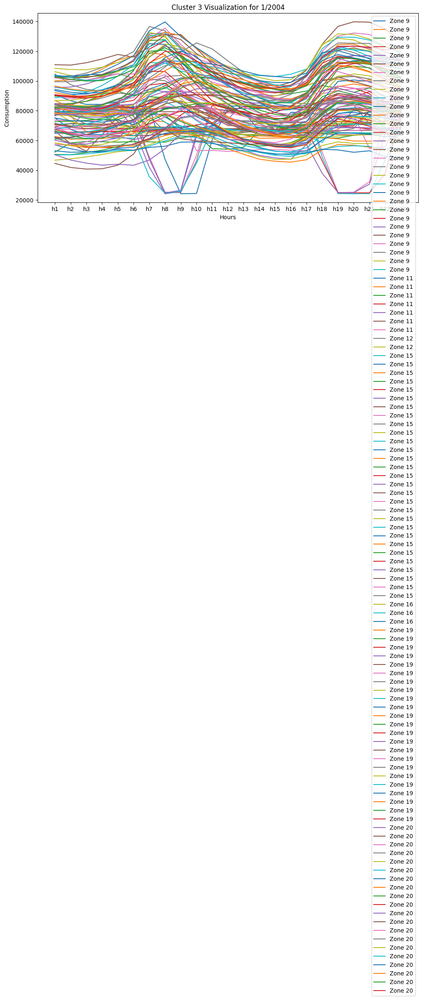

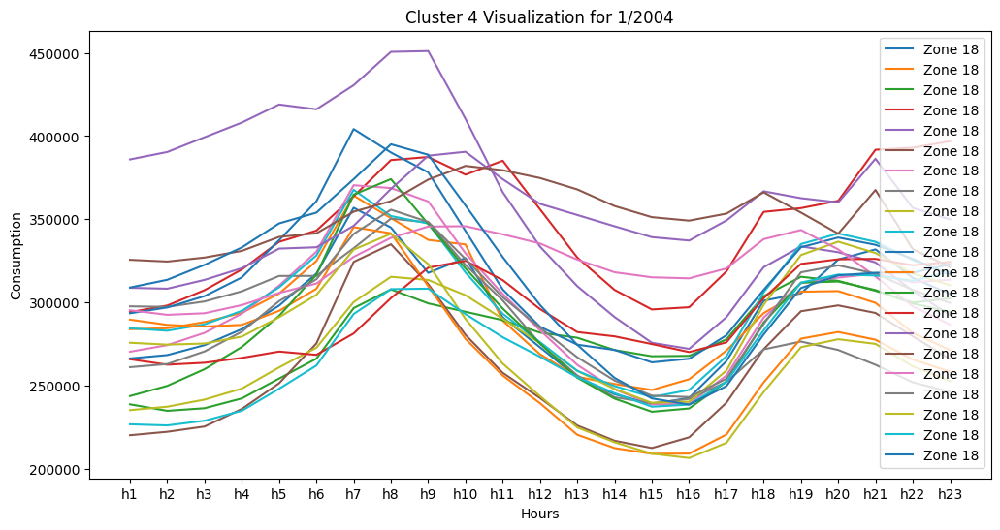

In [ ]:
# Load the electricity consumption data
df = pd.read_csv('dataset.csv')

valid_columns =['h{}'.format(i) for i in range(1, 24)]

# Remove commas from the consumption values if present
for col in valid_columns:
    df[col] = pd.to_numeric(df[col].str.replace(',', ''), errors='coerce')

# Drop rows with missing values
df.dropna(inplace=True)

# Filter the data for the desired year and month
year = 2004
month = 1
df_filtered = df[(df['year'] == year) & (df['month'] == month)]

# Perform clustering using K-means
X = df_filtered[valid_columns].values

num_clusters = 5
kmeans = KMeans(n_clusters=num_clusters)
cluster_labels = kmeans.fit_predict(X)

# Plot each cluster separately
for cluster_label in range(num_clusters):
    cluster_data = df_filtered[cluster_labels == cluster_label]
    plt.figure(figsize=(12, 6))
    for index, row in cluster_data.iterrows():
        plt.plot(valid_columns, row[valid_columns], label=f"Zone {row['zone_id']}")

    plt.xlabel('Hours')
    plt.ylabel('Consumption')
    plt.title(f'Cluster {cluster_label} Visualization for {month}/{year}')
    plt.legend()
    plt.show()


cluster for year 2004 month 1

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


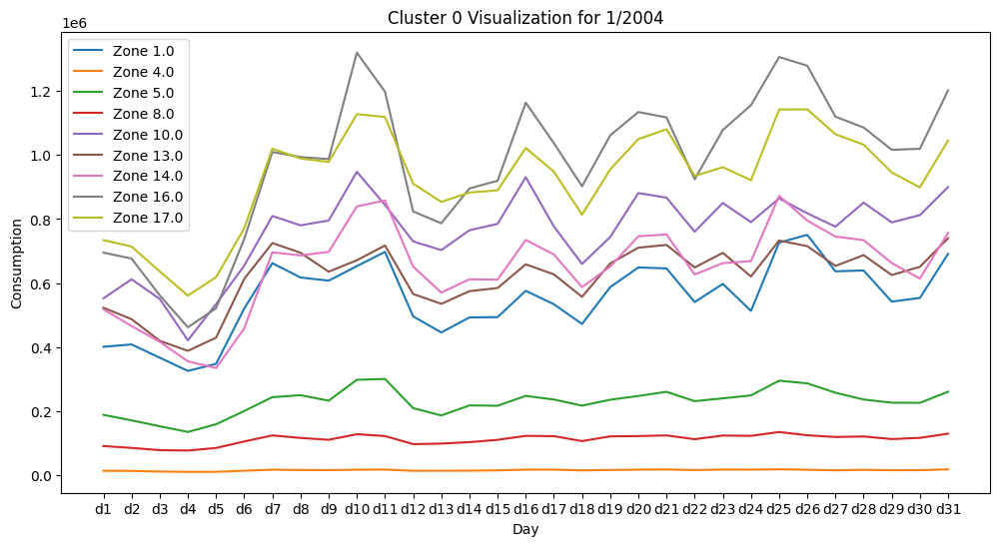

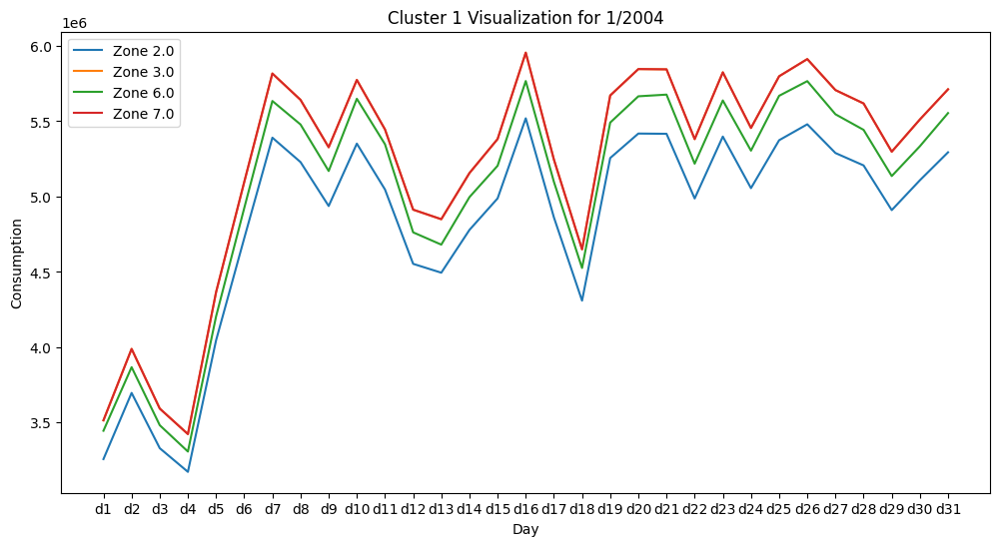

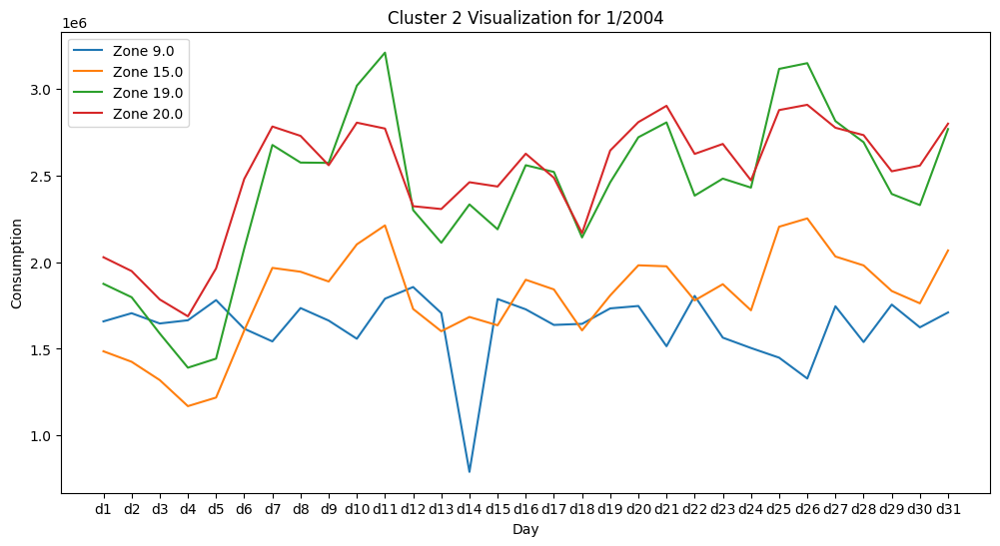

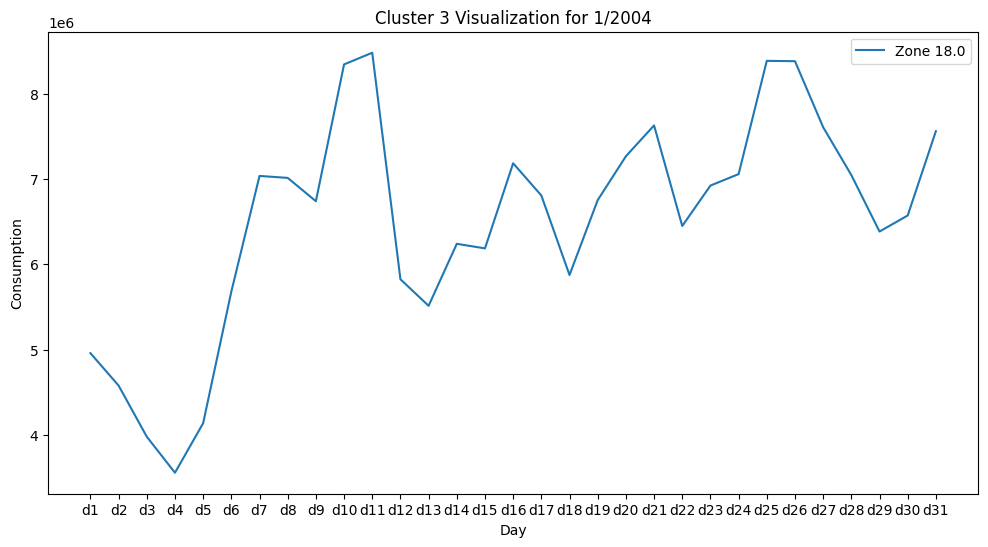

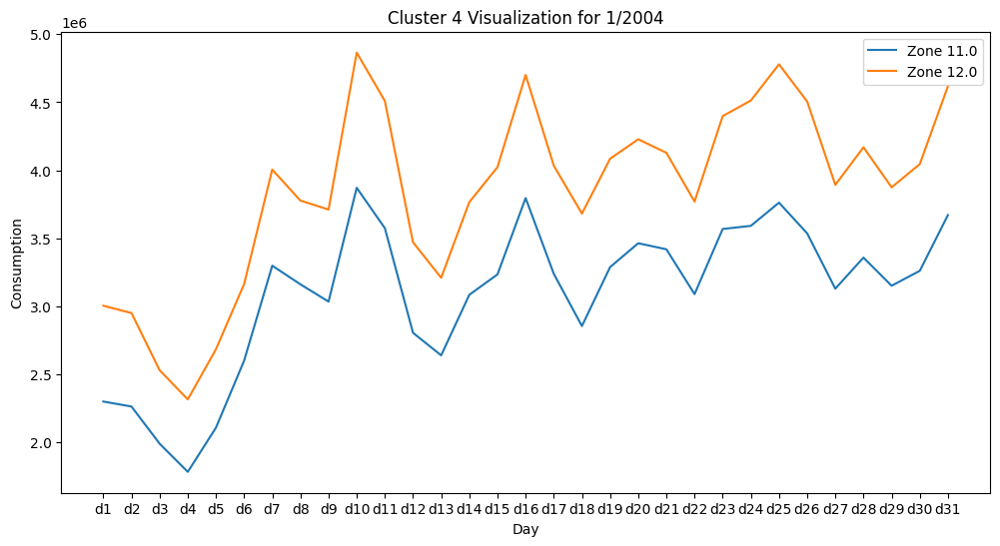

In [7]:
# Load the electricity consumption data
df = pd.read_csv('month.csv')

valid_columns =['d{}'.format(i) for i in range(1, 32)]


# Drop rows with missing values
df.dropna(inplace=True)

# Filter the data for the desired year and month
year = 2004
month = 1
df_filtered = df[(df['year'] == year) & (df['month'] == month)]

# Perform clustering using K-means
X = df_filtered[valid_columns].values

num_clusters = 5
kmeans = KMeans(n_clusters=num_clusters)
cluster_labels = kmeans.fit_predict(X)

# Plot each cluster separately
for cluster_label in range(num_clusters):
    cluster_data = df_filtered[cluster_labels == cluster_label]
    plt.figure(figsize=(12, 6))
    for index, row in cluster_data.iterrows():
        plt.plot(valid_columns, row[valid_columns], label=f"Zone {row['zone_id']}")

    plt.xlabel('Day')
    plt.ylabel('Consumption')
    plt.title(f'Cluster {cluster_label} Visualization for {month}/{year}')
    plt.legend()
    plt.show()


cluster for year 2004

<ipython-input-3-741c35922c02>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_year.dropna(inplace=True)
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-3-741c35922c02>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_year['cluster'] = cluster_labels


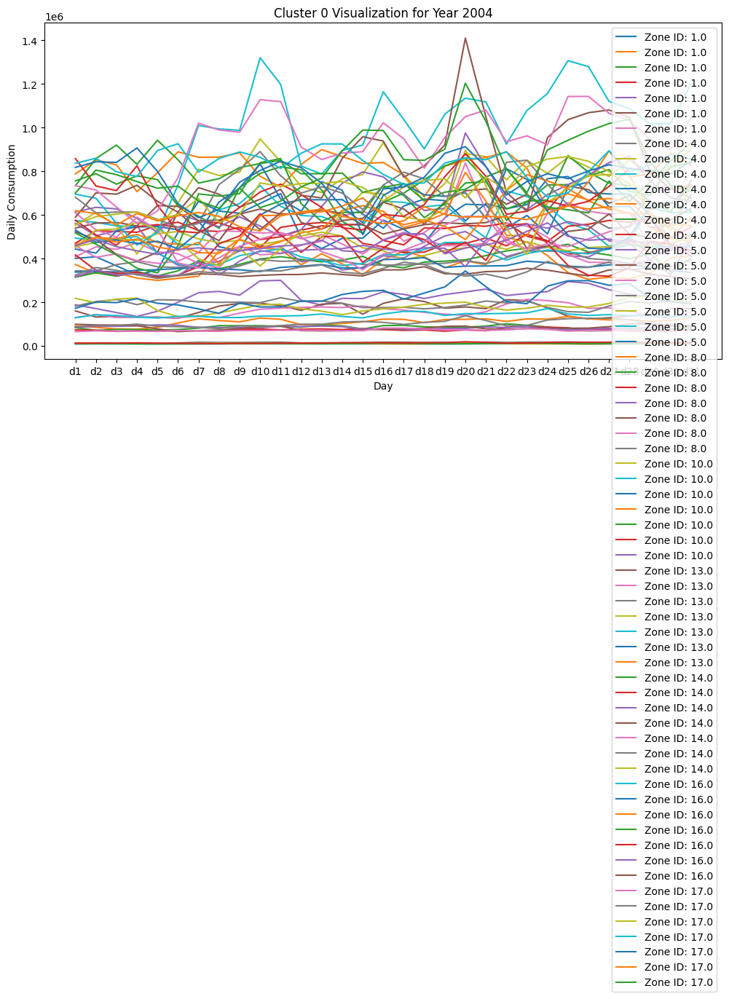

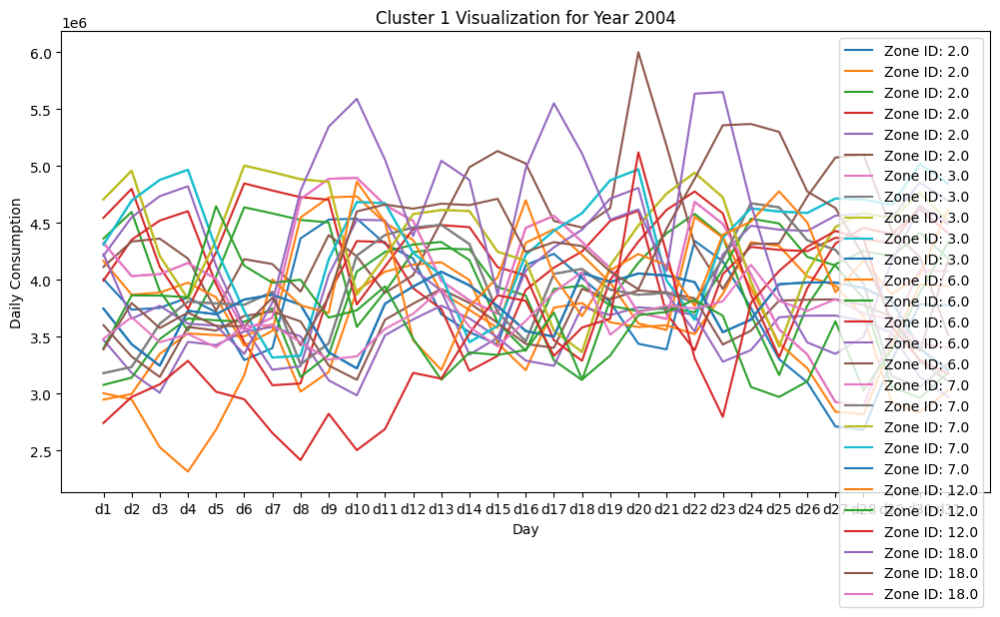

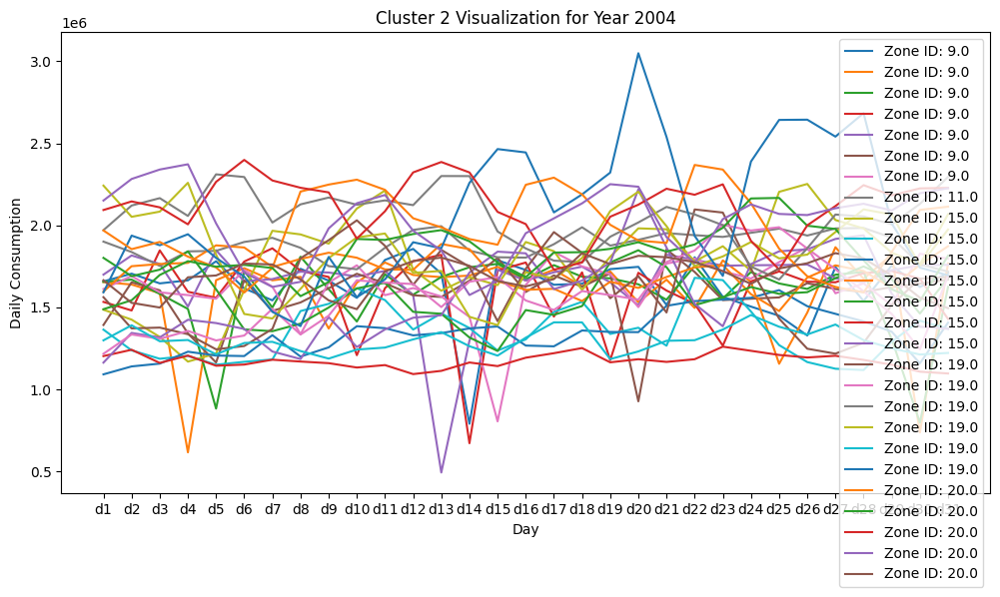

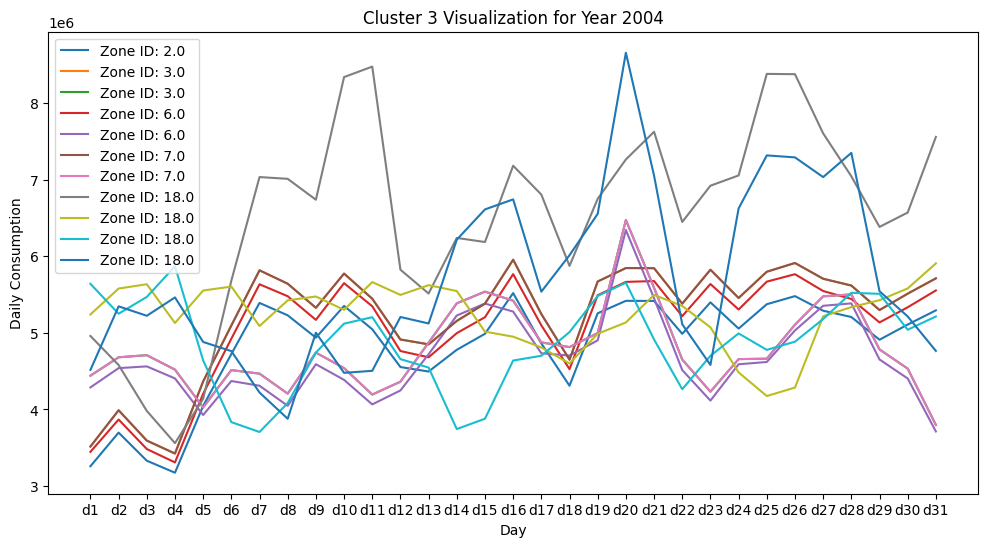

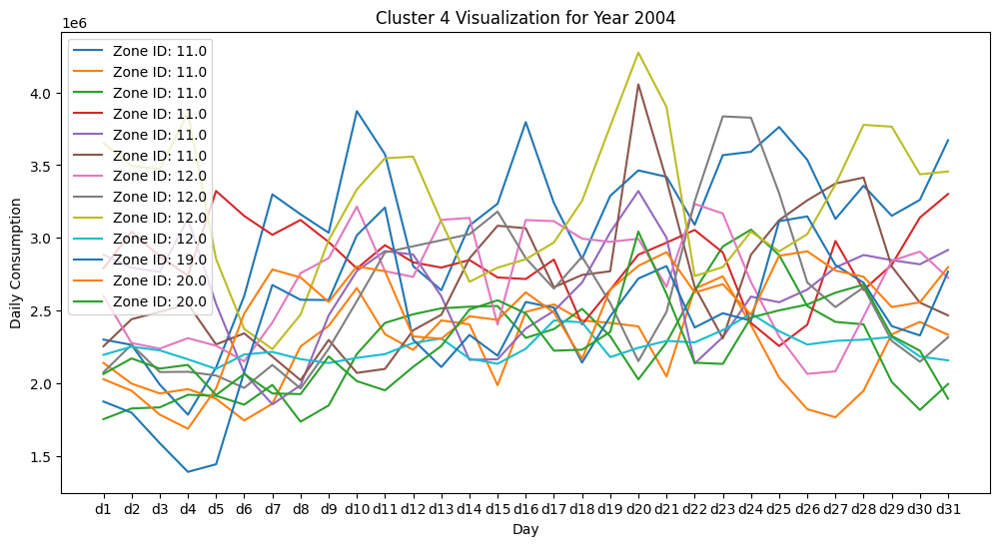

In [3]:
# Load the consumption data
df = pd.read_csv('month.csv')

# Filter the relevant columns for clustering
valid_columns = ['d{}'.format(i) for i in range(1, 32)]
data = df[['zone_id', 'year'] + valid_columns]

# Filter the data for the desired year
year = 2004
data_year = data[data['year'] == year]

# Remove rows with missing values
data_year.dropna(inplace=True)

# Perform clustering using K-means
X = data_year[valid_columns].values

num_clusters = 5
kmeans = KMeans(n_clusters=num_clusters)
cluster_labels = kmeans.fit_predict(X)

# Add the cluster labels to the original DataFrame
data_year['cluster'] = cluster_labels

# Visualize the clusters
for cluster_label in range(num_clusters):
    cluster_data = data_year[data_year['cluster'] == cluster_label]
    plt.figure(figsize=(12, 6))
    for index, row in cluster_data.iterrows():
        plt.plot(valid_columns, row[valid_columns], label=f"Zone ID: {row['zone_id']}")

    plt.xlabel('Day')
    plt.ylabel('Daily Consumption')
    plt.title(f'Cluster {cluster_label} Visualization for Year {year}')
    plt.legend()
    plt.show()


cluster

<ipython-input-16-d0762a40fd25>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.dropna(inplace=True)
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-16-d0762a40fd25>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['cluster'] = cluster_labels


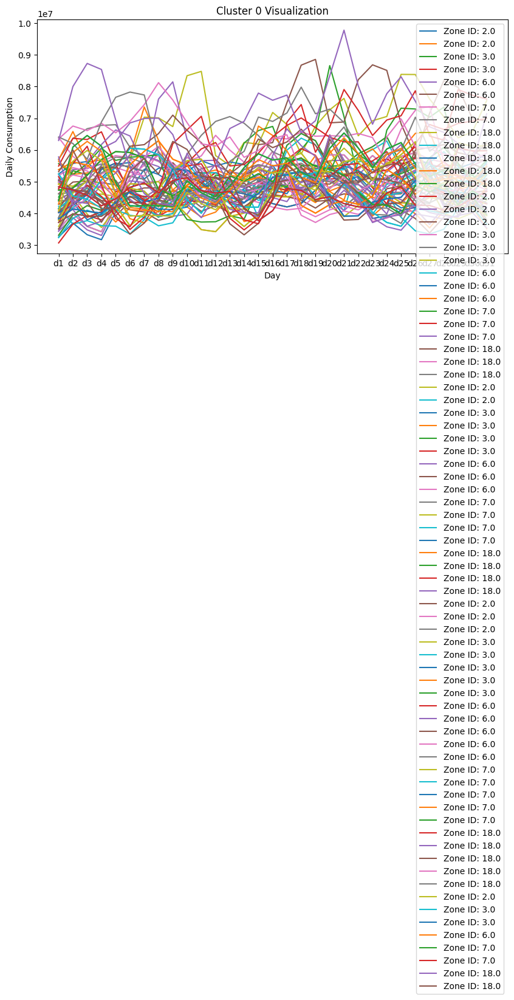

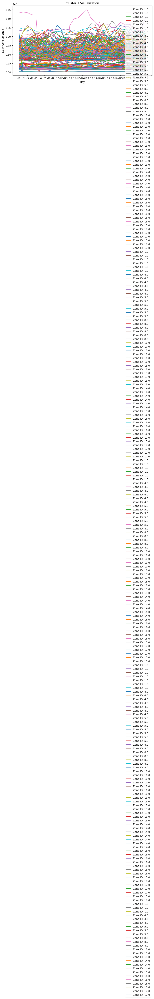

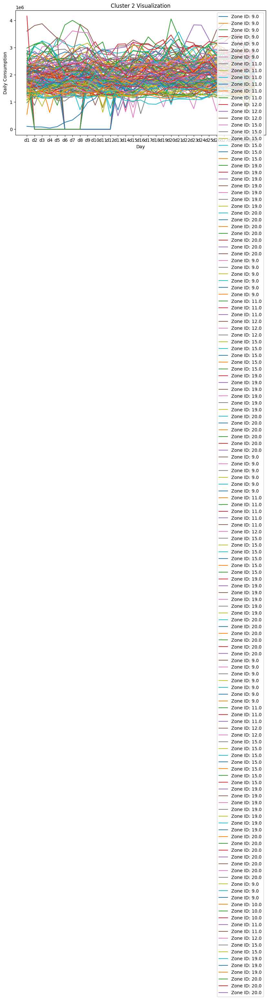

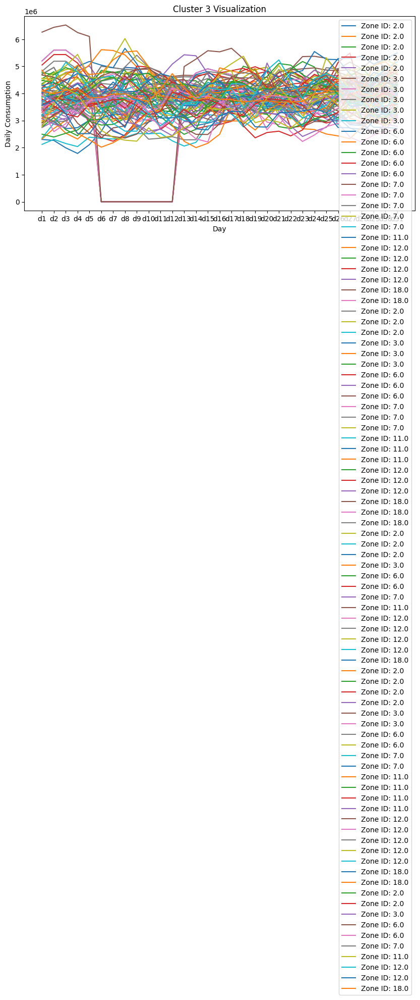

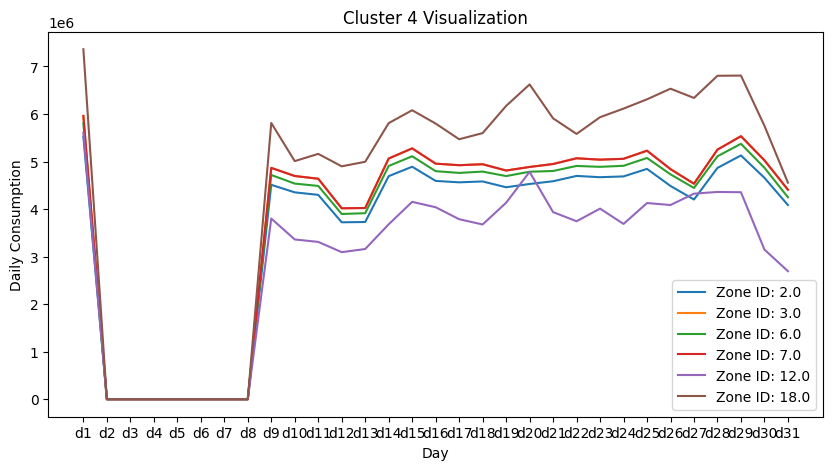

In [16]:
# Load the consumption data
df = pd.read_csv('month.csv')

# Filter the relevant columns for clustering
valid_columns = ['d{}'.format(i) for i in range(1, 32)]
data = df[['zone_id'] + valid_columns]


# Drop rows with missing values
data.dropna(inplace=True)

# Perform clustering using K-means
X = data[valid_columns].values

num_clusters = 5
kmeans = KMeans(n_clusters=num_clusters)
cluster_labels = kmeans.fit_predict(X)

# Add the cluster labels to the original DataFrame
data['cluster'] = cluster_labels

# Visualize the clusters
for cluster_label in range(num_clusters):
    cluster_data = data[data['cluster'] == cluster_label]
    plt.figure(figsize=(10, 5))
    for index, row in cluster_data.iterrows():
        plt.plot(valid_columns, row[valid_columns], label=f"Zone ID: {row['zone_id']}")

    plt.xlabel('Day')
    plt.ylabel('Daily Consumption')
    plt.title(f'Cluster {cluster_label} Visualization')
    plt.legend()
    plt.show()


Consumption Pattern by Zone ID

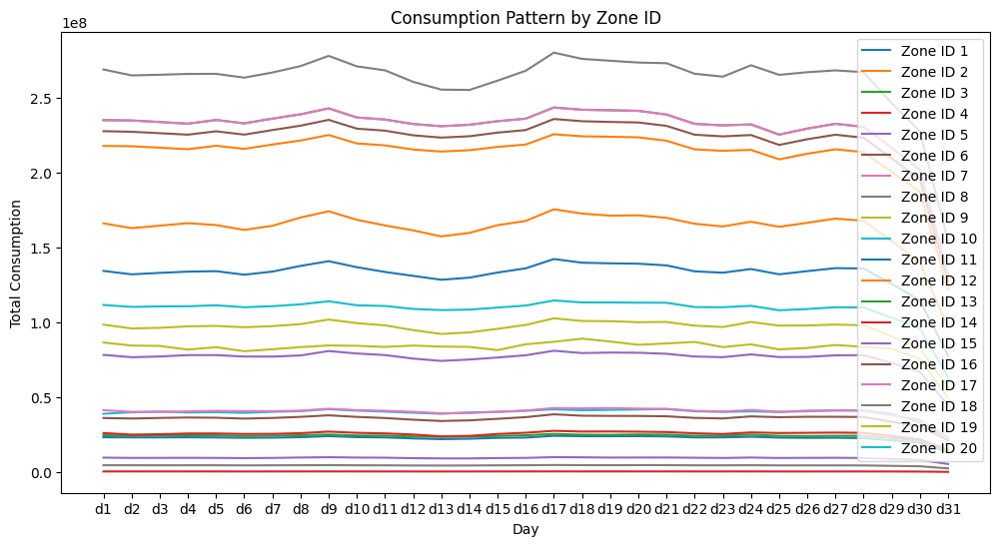

In [5]:
# Assuming you have a DataFrame called 'df' with the consumption data and a 'zone_id' column
df = pd.read_csv('month.csv')

# Calculate the total consumption for each zone ID and day
consumption_by_zone_day = df.groupby(['zone_id'])[valid_columns].sum()

# Transpose the data to have zone IDs as rows and days as columns
consumption_by_zone_day = consumption_by_zone_day.T

# Plot the consumption pattern for each zone ID
plt.figure(figsize=(12, 6))
for zone_id in consumption_by_zone_day.columns:
    plt.plot(valid_columns, consumption_by_zone_day[zone_id], label=f"Zone ID {zone_id}")

plt.xlabel('Day')
plt.ylabel('Total Consumption')
plt.title('Consumption Pattern by Zone ID')
plt.legend()
plt.show()


Consumption Pattern for each Cluster

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


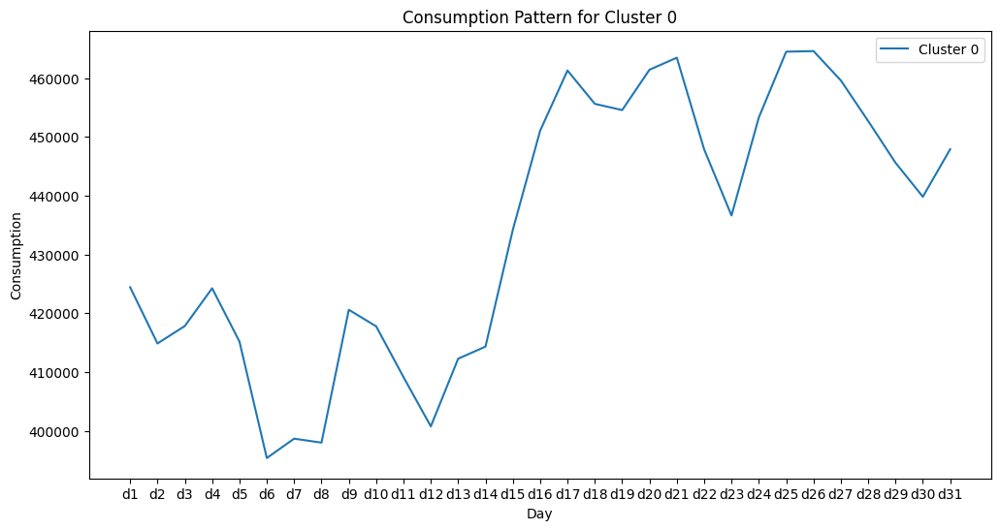

Zone IDs with Cluster Pattern 0: [ 1  4  5  8 10 13 14 16 17 15]


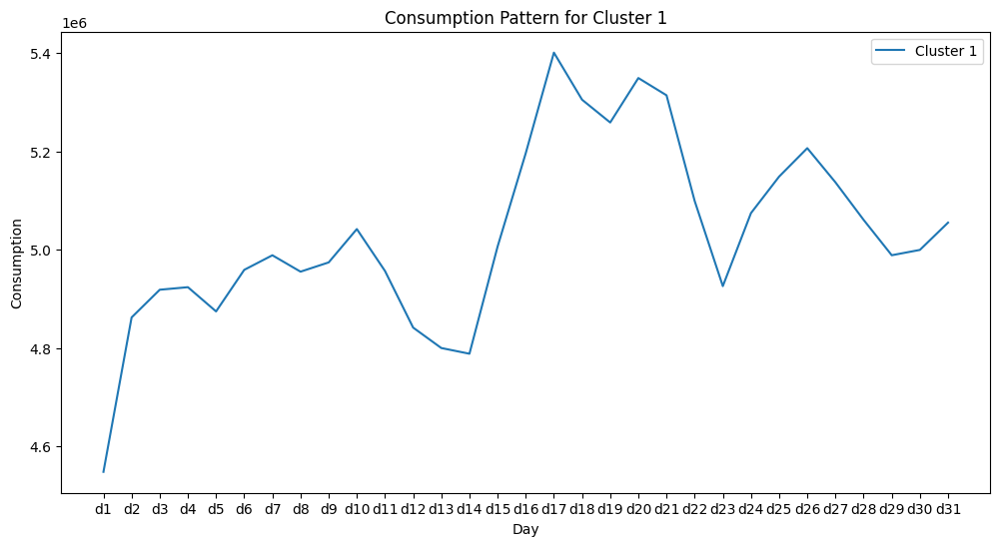

Zone IDs with Cluster Pattern 1: [ 2  3  6  7 18]


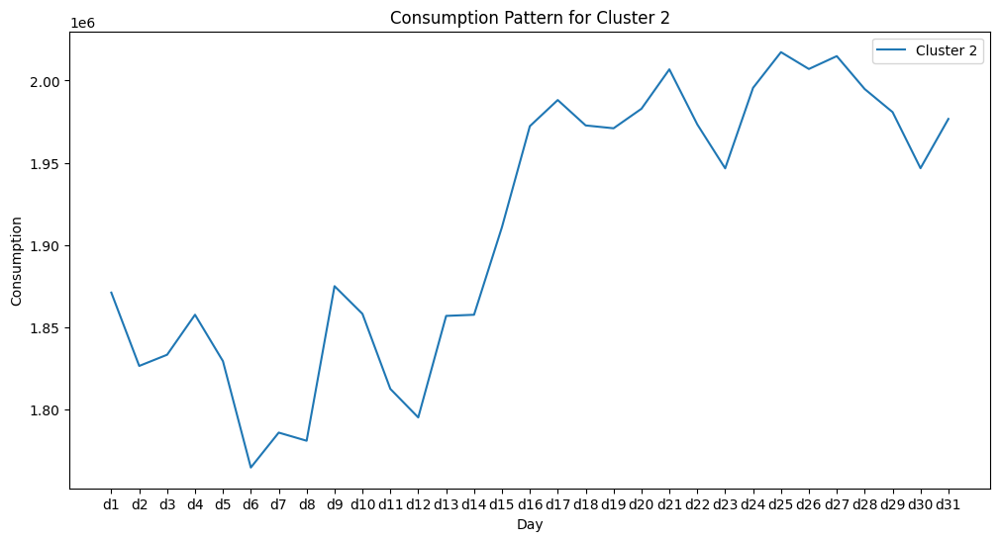

Zone IDs with Cluster Pattern 2: [ 9 11 12 15 19 20 10]


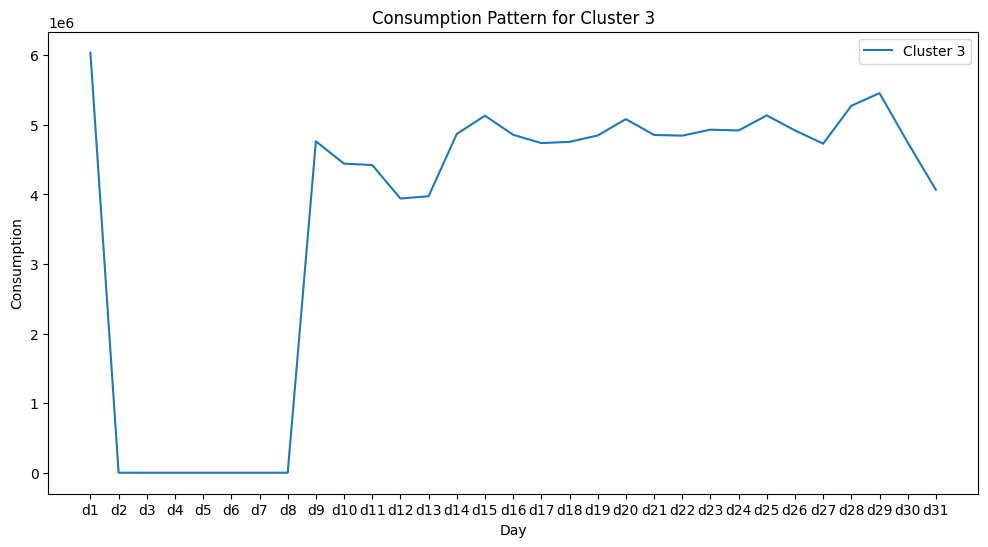

Zone IDs with Cluster Pattern 3: [ 2  3  6  7 12 18]


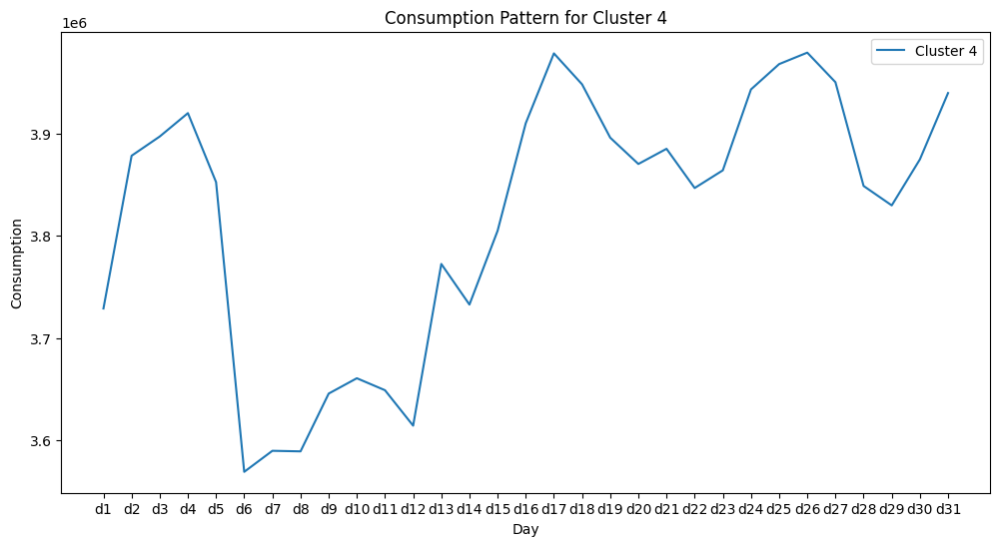

Zone IDs with Cluster Pattern 4: [ 2  3  6  7 11 12 18]


In [17]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Load the consumption data
df = pd.read_csv('month.csv')

# Filter the relevant columns for clustering
valid_columns = ['d{}'.format(i) for i in range(1, 32)]

# Drop rows with missing values
df.dropna(inplace=True)

# Perform clustering using K-means
X = df[valid_columns].values

num_clusters = 5
kmeans = KMeans(n_clusters=num_clusters)
cluster_labels = kmeans.fit_predict(X)

# Add the cluster labels to the DataFrame
df['cluster'] = cluster_labels

# Extract the consumption pattern for each cluster
cluster_patterns = {}
for cluster_label in range(num_clusters):
    cluster_data = df[df['cluster'] == cluster_label]
    cluster_pattern = cluster_data[valid_columns].mean()
    cluster_patterns[cluster_label] = cluster_pattern

# Visualize the consumption pattern for each cluster and show associated zone IDs
for cluster_label, pattern in cluster_patterns.items():
    plt.figure(figsize=(12, 6))
    plt.plot(valid_columns, pattern, label=f"Cluster {cluster_label}")
    plt.xlabel('Day')
    plt.ylabel('Consumption')
    plt.title(f'Consumption Pattern for Cluster {cluster_label}')
    plt.legend()
    plt.show()

    # Get the zone IDs with the current cluster pattern
    zone_ids = df[df['cluster'] == cluster_label]['zone_id'].unique()
    print(f"Zone IDs with Cluster Pattern {cluster_label}: {zone_ids}")


**5. Smart notification system**

Smart notification system to users (via email)

In [31]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
import smtplib
from email.mime.text import MIMEText

# Load the consumption data
df = pd.read_csv('month.csv')

# Load the email data
email_df = pd.read_csv('email.csv')

# Filter the relevant columns for clustering
valid_columns = ['d{}'.format(i) for i in range(1, 32)]

# Drop rows with missing values
df.dropna(inplace=True)

# Filter the data for the desired year and month
year = 2004
month = 1
df = df[(df['year'] == year) & (df['month'] == month)]

# Perform clustering using K-means
X = df[valid_columns].values

num_clusters = 5
kmeans = KMeans(n_clusters=num_clusters)
cluster_labels = kmeans.fit_predict(X)

# Add the cluster labels to the DataFrame
df['cluster'] = cluster_labels

# Merge the consumption data with the email data based on the zone_id
merged_df = pd.merge(df, email_df, on='zone_id')

# Calculate the average consumption for each day
average_consumption = df[valid_columns].mean()

# Configure email settings
email_sender = 'mobina.bijani.avval@gmail.com'  # Replace with your email address
email_password = 'zrkypvrsqrvqqemd'  # Replace with your email password
consumption_threshold = 1.2  # Modify the threshold as per your requirement

# Send email to each user
for index, row in merged_df.iterrows():
    # Get the user's email, zone id, and consumption data
    email_address = row['email']
    zone_id = row['zone_id']
    consumption_data = row[valid_columns]

    # Calculate the consumption level (high, medium, or low) for each day
    consumption_level = []
    low_consumption_days = 0  # Count of days with low consumption
    medium_consumption_days = 0
    high_consumption_days = 0
    for i, consumption in enumerate(consumption_data):
        if consumption > consumption_threshold * average_consumption[i]:
            consumption_level.append('high')
            high_consumption_days += 1
        elif consumption < (1 / consumption_threshold) * average_consumption[i]:
            consumption_level.append('low')
            low_consumption_days += 1
        else:
            consumption_level.append('medium')
            medium_consumption_days += 1

    # Generate email content
    message = f"Zone ID: {zone_id}\n\nYour consumption level for each day of the month:\n\n"
    for i, level in enumerate(consumption_level):
        message += f"Day {i+1}: {level}\n"

    # Add additional message based on consumption levels
    if low_consumption_days > 15:
        message += "\nYour consumption has been consistently low for more than 15 days this month. We encourage you to review your usage."
    elif medium_consumption_days > 15:
        message += "\nYour consumption has been medium for more than 15 days this month. You might consider optimizing your usage for efficiency."
    elif high_consumption_days > 15:
        message += "\nYour consumption has been consistently high for more than 15 days this month. We recommend monitoring your usage for potential savings."

    try:
        # Create email message
        email_message = MIMEText(message)
        email_message['From'] = email_sender
        email_message['To'] = email_address
        email_message['Subject'] = 'Monthly Consumption Level'

        # Connect to SMTP server and send the email
        with smtplib.SMTP('smtp.gmail.com', 587) as smtp_server:
            smtp_server.starttls()
            smtp_server.login(email_sender, email_password)
            smtp_server.send_message(email_message)

        print(f"Email sent to {email_address}")

    except Exception as e:
        print(f"Error sending email to {email_address}: {str(e)}")


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Email sent to mobina.bijani.com@gmail.com
Email sent to mobina.bijani.com@gmail.com
Email sent to mobina.bijani.com@gmail.com
Email sent to mobina.bijani.com@gmail.com
Email sent to mobina.bijani.com@gmail.com
Email sent to mobina.bijani.com@gmail.com
Email sent to mobina.bijani.com@gmail.com
Email sent to mobina.bijani.com@gmail.com
Email sent to mobina.bijani.com@gmail.com
Email sent to mobina.bijani.com@gmail.com
Email sent to mobina.bijani.com@gmail.com
Email sent to mobina.bijani.com@gmail.com
Email sent to mobina.bijani.com@gmail.com
Email sent to mobina.bijani.com@gmail.com
Email sent to mobina.bijani.com@gmail.com
Email sent to mobina.bijani.com@gmail.com
Email sent to mobina.bijani.com@gmail.com
Email sent to mobina.bijani.com@gmail.com
Email sent to mobina.bijani.com@gmail.com
Email sent to mobina.bijani.com@gmail.com


In [28]:
import pandas as pd
import numpy as np

# Load the consumption data
df = pd.read_csv('month.csv')

# Filter the relevant columns for clustering
valid_columns = ['d{}'.format(i) for i in range(1, 32)]

# Drop rows with missing values
df.dropna(inplace=True)

# Filter the data for the desired year and month
year = 2004
month = 1
df = df[(df['year'] == year) & (df['month'] == month)]

# Calculate the average consumption for each user
average_consumption = df[valid_columns].mean(axis=1)

# Calculate the average consumption of all users in month 1 of year 2004
average_consumption_all_users = average_consumption.mean()


# Function to determine consumption level based on average consumption
def determine_consumption_level(consumption):
    consumption_threshold = 1.2  # Modify the threshold as per your requirement

    if consumption > consumption_threshold * average_consumption.mean():
        return 'high'
    elif consumption < (1 / consumption_threshold) * average_consumption.mean():
        return 'low'
    else:
        return 'medium'

# Iterate over each user and display their average consumption and consumption level
for index, row in df.iterrows():
    zone_id = row['zone_id']
    user_consumption = row[valid_columns]
    user_average_consumption = user_consumption.mean()

    consumption_level = determine_consumption_level(user_average_consumption)

    print(f"Zone ID: {zone_id}")
    print(f"Average Consumption: {user_average_consumption}")
    print(f"Consumption Level: {consumption_level}")
    print()

# Display the average consumption of all users in month 1 of year 2004
print(f"Average Consumption of All Users: {average_consumption_all_users}")

Zone ID: 1.0
Average Consumption: 554478.2258064516
Consumption Level: low

Zone ID: 2.0
Average Consumption: 4834923.935483871
Consumption Level: high

Zone ID: 3.0
Average Consumption: 5216892.741935484
Consumption Level: high

Zone ID: 4.0
Average Consumption: 15192.516129032258
Consumption Level: low

Zone ID: 5.0
Average Consumption: 229301.51612903227
Consumption Level: low

Zone ID: 6.0
Average Consumption: 5064225.29032258
Consumption Level: high

Zone ID: 7.0
Average Consumption: 5216892.741935484
Consumption Level: high

Zone ID: 8.0
Average Consumption: 111583.35483870968
Consumption Level: low

Zone ID: 9.0
Average Consumption: 1629852.677419355
Consumption Level: low

Zone ID: 10.0
Average Consumption: 759925.0967741936
Consumption Level: low

Zone ID: 11.0
Average Consumption: 3095021.1612903224
Consumption Level: high

Zone ID: 12.0
Average Consumption: 3852203.8387096776
Consumption Level: high

Zone ID: 13.0
Average Consumption: 621499.6129032258
Consumption Level: low

Smart notification system to users (via sms)

In [21]:
!pip install twilio

In [46]:
import time
from twilio.rest import Client

# Replace 'YOUR_TWILIO_ACCOUNT_SID', 'YOUR_TWILIO_AUTH_TOKEN', and 'YOUR_TWILIO_PHONE_NUMBER' with your actual values
account_sid = 'ACafae6bd061081a8db2c57dba1ae6f188'
auth_token = 'b99abc97090cab5ac37c36c55ce21147'
twilio_phone_number = '+16183865799'

# Send SMS to users with 10 continuous days of high consumption for each zone ID
for zone_id in merged_df['zone_id'].unique():
    zone_data = merged_df[merged_df['zone_id'] == zone_id]
    continuous_high_consumption_days = 0  # Counter for continuous high consumption days

    for index, row in zone_data.iterrows():
        # Get the user's email, zone id, and consumption data
        email_address = row['email']
        consumption_data = row[valid_columns]
        phone_number = '+{}'.format(str(row['phone_number']).replace('"', ''))
 # Add the '+' sign before the phone number and Remove the quotation marks from the phone number

        # Calculate the consumption level (high, medium, or low) for each day
        consumption_level = []
        low_consumption_days = 0  # Count of days with low consumption
        medium_consumption_days = 0
        high_consumption_days = 0

        for i, consumption in enumerate(consumption_data):
            if consumption > consumption_threshold * average_consumption[i]:
                consumption_level.append('high')
                high_consumption_days += 1
            elif consumption < (1 / consumption_threshold) * average_consumption[i]:
                consumption_level.append('low')
                low_consumption_days += 1
            else:
                consumption_level.append('medium')
                medium_consumption_days += 1

        # Check for continuous high consumption
        continuous_high_consumption_days += 1 if high_consumption_days > 0 else 0

        # Send SMS if 10 continuous high consumption days are reached
        if continuous_high_consumption_days >= 25:
            # Connect to Twilio and send an SMS
            client = Client(account_sid, auth_token)
            message = f"Alert: Zone ID {zone_id} - Your consumption is consistently high. You should optimize it."

            sms = client.messages.create(
                from_=twilio_phone_number,
                body=message,
                to=phone_number  # Send the SMS to the retrieved phone number
            )

            print(f"SMS message sent with ID: {sms.sid}")
            time.sleep(5)  # Add a delay of 3 seconds
            break  # Exit the loop after sending the SMS


SMS message sent with ID: SM0d104b4a67a73113fd129308c6c666a7
SMS message sent with ID: SM8745a246698a159eb2180d90dc2fea5d
SMS message sent with ID: SMc546a2a4c9730afe013e594ea429e2bb
SMS message sent with ID: SM953e771cf05b578df0aa0df8dee21611
SMS message sent with ID: SMaa0bf43526440d1dfcf1bc012087a33e
SMS message sent with ID: SMcf5fd33103debaafc3afde3b65e3be78
SMS message sent with ID: SMc144e8729278259a73f99e690e85be47
SMS message sent with ID: SMc598620344d499861f35a51d40e20491
SMS message sent with ID: SMc70bc669fb242db4c5fe011ae081d562


**6. Ranking**

Total Consumption of year 2004

In [ ]:
# Filter the data for the desired year
year = 2004
df_filtered = df[df['year'] == year]

# Calculate the sum of consumption for each zone ID
total_consumption_by_zone = df_filtered.groupby('zone_id')[valid_columns].sum()

# Sort the zone IDs based on total consumption in descending order
sorted_zone_ids = total_consumption_by_zone.sum(axis=1)

# Select the top 20 zone IDs
top_20_zone_ids = sorted_zone_ids.head(20)

# Calculate the overall total consumption for the top 20 zone IDs
overall_total_consumption = top_20_zone_ids.sum()

# Display the total consumption for each zone ID and the overall total consumption
for zone_id in top_20_zone_ids.index:
    zone_total_consumption = top_20_zone_ids[zone_id]
    print("Zone ID:", zone_id, "Total Consumption:", zone_total_consumption)

print("Overall Total Consumption:", overall_total_consumption)


Zone ID: 1 Total Consumption: 95964182.0
Zone ID: 2 Total Consumption: 874876723.0
Zone ID: 3 Total Consumption: 943993800.0
Zone ID: 4 Total Consumption: 2525730.0
Zone ID: 5 Total Consumption: 40195209.0
Zone ID: 6 Total Consumption: 915071894.0
Zone ID: 7 Total Consumption: 943993800.0
Zone ID: 8 Total Consumption: 18921551.0
Zone ID: 9 Total Consumption: 349159083.0
Zone ID: 10 Total Consumption: 145301564.0
Zone ID: 11 Total Consumption: 546280489.0
Zone ID: 12 Total Consumption: 671460362.0
Zone ID: 13 Total Consumption: 101675242.0
Zone ID: 14 Total Consumption: 107934268.0
Zone ID: 15 Total Consumption: 326400019.0
Zone ID: 16 Total Consumption: 150937703.0
Zone ID: 17 Total Consumption: 165679751.0
Zone ID: 18 Total Consumption: 1074055032.0
Zone ID: 19 Total Consumption: 398609484.0
Zone ID: 20 Total Consumption: 447070706.0
Overall Total Consumption: 8320106592.0


 ranking of users for year 2004

In [ ]:
# Filter the data for the desired year
year = 2004
df_filtered = df[df['year'] == year]

# Calculate the total consumption for each user
total_consumption_by_user = df_filtered.groupby('zone_id')[valid_columns].sum().sum(axis=1)

# Sort the users based on total consumption in descending order
sorted_users = total_consumption_by_user.sort_values(ascending=False)

# Display the ranking of users based on total consumption
print("Ranking of Users Based on Total Consumption:")
for rank, (zone_id, consumption) in enumerate(sorted_users.iteritems(), start=1):
    print(f"Rank {rank}: Zone ID {zone_id} - Total Consumption {consumption}")


Ranking of Users Based on Total Consumption:
Rank 1: Zone ID 18 - Total Consumption 1074055032.0
Rank 2: Zone ID 3 - Total Consumption 943993800.0
Rank 3: Zone ID 7 - Total Consumption 943993800.0
Rank 4: Zone ID 6 - Total Consumption 915071894.0
Rank 5: Zone ID 2 - Total Consumption 874876723.0
Rank 6: Zone ID 12 - Total Consumption 671460362.0
Rank 7: Zone ID 11 - Total Consumption 546280489.0
Rank 8: Zone ID 20 - Total Consumption 447070706.0
Rank 9: Zone ID 19 - Total Consumption 398609484.0
Rank 10: Zone ID 9 - Total Consumption 349159083.0
Rank 11: Zone ID 15 - Total Consumption 326400019.0
Rank 12: Zone ID 17 - Total Consumption 165679751.0
Rank 13: Zone ID 16 - Total Consumption 150937703.0
Rank 14: Zone ID 10 - Total Consumption 145301564.0
Rank 15: Zone ID 14 - Total Consumption 107934268.0
Rank 16: Zone ID 13 - Total Consumption 101675242.0
Rank 17: Zone ID 1 - Total Consumption 95964182.0
Rank 18: Zone ID 5 - Total Consumption 40195209.0
Rank 19: Zone ID 8 - Total Consumpti

<ipython-input-32-78d7fac06347>:13: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for rank, (zone_id, consumption) in enumerate(sorted_users.iteritems(), start=1):


Rank according to total consumption

In [ ]:
import pandas as pd

# Calculate the total consumption for each user (zone_id) across all years
total_consumption = df.groupby('zone_id')['total_consumption'].sum()

# Sort the users based on total consumption in descending order
ranked_users = total_consumption.sort_values(ascending=False)

# Print the ranked users
print(ranked_users)


zone_id
18    8129663659
3     7136036706
7     7136036706
6     6909147471
2     6613552350
12    5060428249
11    4104436948
20    3374361428
19    2979479364
9     2573968584
15    2369808762
17    1251232837
10    1236774440
16    1112488750
14     794009894
13     748541231
1      709560216
5      295624223
8      143645257
4       18986468
Name: total_consumption, dtype: int64


Rank according to consuptions in the pick hours

In [ ]:
# Calculate the average consumption for each hour
hourly_consumption = df.iloc[:, 5:28].mean()

# Find the pick hours with the highest average consumption
pick_hours = hourly_consumption.nlargest(3).index.tolist()

# Print the pick hours
print("Pick Hours:", pick_hours)

# Calculate the total consumption for each user (zone_id) during pick hours
df['pick_hour_consumption'] = df[pick_hours].sum(axis=1)

# Rank the users based on their consumption during pick hours
ranked_users = df.groupby('zone_id')['pick_hour_consumption'].sum().sort_values(ascending=False)

# Print the ranked users
print(ranked_users)


Pick Hours: ['h20', 'h19', 'h21']
zone_id
18    1196665142
3      993494239
7      993494239
6      967492283
2      920752838
12     771064057
11     600103618
20     477178639
19     440609723
15     330994701
9      313378128
17     176741047
10     175903159
16     162948751
14     119983838
13     106318180
1      105314233
5       46739501
8       21317418
4        2807960
Name: pick_hour_consumption, dtype: int64


Rank acording to decreese in consumption

In [ ]:
# Calculate the total consumption for each user (zone_id) in the first year
first_year_consumption = df[df['year'] == 2004].groupby('zone_id')['total_consumption'].sum()

# Calculate the total consumption for each user (zone_id) in the last year
last_year_consumption = df[df['year'] == 2008].groupby('zone_id')['total_consumption'].sum()

# Calculate the percentage decrease for each user
percentage_decrease = ((last_year_consumption - first_year_consumption) / first_year_consumption) * 100

# Calculate the amount of decrease for each user
amount_decrease = last_year_consumption - first_year_consumption

# Create a DataFrame to store the results
decrease_data = pd.DataFrame({'Percentage Decrease': percentage_decrease,
                              'init Consum': first_year_consumption,
                              'Final Consum': last_year_consumption,
                              'Decrease': amount_decrease})

# Sort the users based on percentage decrease in consumption
sorted_data = decrease_data.sort_values('Percentage Decrease', ascending=True)

# Display the users, their first year consumption, last year consumption,
# percentage decrease, and amount of decrease
print(sorted_data)


         Percentage Decrease  init Consum  Final Consum   Decrease
zone_id                                                           
5                 -50.315032     65643549      32614976  -33028573
15                -49.771140    532510964     267474188 -265036776
9                 -49.348764    587631650     297642692 -289988958
14                -47.864959    174558120      91005948  -83552172
16                -47.643106    243523715     127501453 -116022262
13                -47.640781    166089035      86962922  -79126113
1                 -46.984773    156305631      82865785  -73439846
6                 -46.835800   1520997068     808625923 -712371145
4                 -46.776375      4176897       2223096   -1953801
3                 -46.678475   1570335514     837326846 -733008668
7                 -46.678475   1570335514     837326846 -733008668
2                 -46.678473   1455359080     776019690 -679339390
19                -45.956791    648949744     350713265 -29823